In [2]:
import pandas as pd
events_data = pd.read_csv('event_data_train.csv')
submission_data = pd.read_csv('submissions_data_train.csv')
events_data['date'] = pd.to_datetime(events_data.timestamp, unit = 's')
events_data['day'] = events_data.date.dt.date

submission_data['date'] = pd.to_datetime(submission_data.timestamp, unit = 's')
submission_data['day'] = submission_data.date.dt.date

users_data = events_data.groupby('user_id', as_index= False)\
        .agg({'timestamp': 'max'})\
        .rename({'timestamp':'last_timestamp'}, axis = 'columns')
now = 1526772811
drop_out_threasold = 2592000

users_data['is_gone_user'] = (now - users_data.last_timestamp) > drop_out_threasold
users_scores = submission_data.pivot_table(index='user_id',\
                        columns = 'submission_status',\
                        values = 'step_id',\
                        aggfunc = 'count',\
                        fill_value = 0)\
                        .reset_index()
users_data = users_data.merge(users_scores, on = 'user_id', how = 'outer')
users_data = users_data.fillna(0)
users_invent_data = events_data.pivot_table(index = 'user_id',
                        columns = 'action',
                        values  = 'step_id',
                        aggfunc = 'count',
                        fill_value = 0).reset_index()
users_data = users_data.merge(users_invent_data, how = 'outer')
users_days = events_data.groupby('user_id').day.nunique()
users_days.to_frame().reset_index()
users_data = users_data.merge(users_days, on = 'user_id', how = 'outer')
users_data['passed_corse'] = users_data.passed > 170

In [3]:
users_data.head()

,user_id,last_timestamp,is_gone_user,correct,wrong,discovered,passed,started_attempt,viewed,day,passed_corse
0,1,1472827464,True,0.0,0.0,1,0,0,1,1,False
1,2,1519226966,True,2.0,0.0,9,9,2,10,2,False
2,3,1444581588,True,29.0,23.0,91,87,30,192,7,False
3,5,1499859939,True,2.0,2.0,11,11,4,12,2,False
4,7,1521634660,True,0.0,0.0,1,1,0,1,1,False


In [4]:
events_data

,step_id,timestamp,action,user_id,date,day
0,32815,1434340848,viewed,17632,2015-06-15 04:00:48,2015-06-15
1,32815,1434340848,passed,17632,2015-06-15 04:00:48,2015-06-15
2,32815,1434340848,discovered,17632,2015-06-15 04:00:48,2015-06-15
3,32811,1434340895,discovered,17632,2015-06-15 04:01:35,2015-06-15
4,32811,1434340895,viewed,17632,2015-06-15 04:01:35,2015-06-15
...,...,...,...,...,...,...
3480698,33375,1526772685,viewed,11677,2018-05-19 23:31:25,2018-05-19
3480699,32815,1526772750,viewed,5198,2018-05-19 23:32:30,2018-05-19
3480700,32815,1526772750,discovered,5198,2018-05-19 23:32:30,2018-05-19
3480701,32815,1526772750,passed,5198,2018-05-19 23:32:30,2018-05-19


In [5]:
submission_data

,step_id,timestamp,submission_status,user_id,date,day
0,31971,1434349275,correct,15853,2015-06-15 06:21:15,2015-06-15
1,31972,1434348300,correct,15853,2015-06-15 06:05:00,2015-06-15
2,31972,1478852149,wrong,15853,2016-11-11 08:15:49,2016-11-11
3,31972,1478852164,correct,15853,2016-11-11 08:16:04,2016-11-11
4,31976,1434348123,wrong,15853,2015-06-15 06:02:03,2015-06-15
...,...,...,...,...,...,...
509099,120745,1501946959,wrong,2615,2017-08-05 15:29:19,2017-08-05
509100,120745,1503059927,correct,13177,2017-08-18 12:38:47,2017-08-18
509101,120745,1506348153,wrong,15253,2017-09-25 14:02:33,2017-09-25
509102,120745,1523035316,wrong,1424,2018-04-06 17:21:56,2018-04-06


In [9]:
users_data[users_data['passed_corse']].day.median()

20.0

In [1]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,8))
import plotly.express as px
fig = px.histogram(users_data[users_data['passed_corse']].day, title='HISTOGRAM')
fig.show()
fig.tight_layout()

In [22]:
events_data

,step_id,timestamp,action,user_id,date,day
0,32815,1434340848,viewed,17632,2015-06-15 04:00:48,2015-06-15
1,32815,1434340848,passed,17632,2015-06-15 04:00:48,2015-06-15
2,32815,1434340848,discovered,17632,2015-06-15 04:00:48,2015-06-15
3,32811,1434340895,discovered,17632,2015-06-15 04:01:35,2015-06-15
4,32811,1434340895,viewed,17632,2015-06-15 04:01:35,2015-06-15
...,...,...,...,...,...,...
3480698,33375,1526772685,viewed,11677,2018-05-19 23:31:25,2018-05-19
3480699,32815,1526772750,viewed,5198,2018-05-19 23:32:30,2018-05-19
3480700,32815,1526772750,discovered,5198,2018-05-19 23:32:30,2018-05-19
3480701,32815,1526772750,passed,5198,2018-05-19 23:32:30,2018-05-19


In [31]:
min_timestamp = events_data.groupby('user_id', as_index=False)['timestamp'].min().rename({'timestamp':'min_timestamp'}, axis=1)
min_timestamp

,user_id,min_timestamp
0,1,1472827464
1,2,1514383364
2,3,1434358476
3,5,1466156809
4,7,1521634660
...,...,...
19229,26790,1451484016
19230,26793,1510225031
19231,26794,1495287049
19232,26797,1508425316


In [33]:
users_data = users_data.merge(min_timestamp, how='outer')

In [89]:
users_data[users_data.is_gone_user == True].groupby

,user_id,last_timestamp,is_gone_user,correct,wrong,discovered,passed,started_attempt,viewed,day,passed_corse,min_timestamp
0,1,1472827464,True,0.0,0.0,1,0,0,1,1,False,1472827464
1,2,1519226966,True,2.0,0.0,9,9,2,10,2,False,1514383364
2,3,1444581588,True,29.0,23.0,91,87,30,192,7,False,1434358476
3,5,1499859939,True,2.0,2.0,11,11,4,12,2,False,1466156809
4,7,1521634660,True,0.0,0.0,1,1,0,1,1,False,1521634660
...,...,...,...,...,...,...,...,...,...,...,...,...
19229,26790,1517495987,True,1.0,0.0,8,8,1,9,4,False,1451484016
19230,26793,1510225034,True,0.0,0.0,1,0,1,1,1,False,1510225031
19231,26794,1512035039,True,33.0,9.0,69,69,34,180,9,False,1495287049
19232,26797,1509995096,True,2.0,0.0,10,10,2,13,2,False,1508425316


In [47]:
from tqdm.auto import tqdm
event_data_train = pd.DataFrame()
for user_id in tqdm(users_data.user_id):
    min_user_time = users_data[users_data.user_id == user_id].min_timestamp.item()
    min_treshold = min_user_time + 60 * 60 * 24 * 3
    users_events_data = events_data[(events_data.user_id == user_id) & (events_data.timestamp < min_treshold)]
    event_data_train = event_data_train.append(users_events_data)


  0%|          | 0/19234 [00:00<?, ?it/s]

C:\Users\User\AppData\Local\Temp\ipykernel_23064\3993373372.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\User\AppData\Local\Temp\ipykernel_23064\3993373372.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\User\AppData\Local\Temp\ipykernel_23064\3993373372.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\User\AppData\Local\Temp\ipykernel_23064\3993373372.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\User\AppData\Local\Temp\ipykernel_23064\3993373372.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inste

In [53]:
events_data.user_id

,step_id,timestamp,action,user_id,date,day
0,32815,1434340848,viewed,17632,2015-06-15 04:00:48,2015-06-15
1,32815,1434340848,passed,17632,2015-06-15 04:00:48,2015-06-15
2,32815,1434340848,discovered,17632,2015-06-15 04:00:48,2015-06-15
3,32811,1434340895,discovered,17632,2015-06-15 04:01:35,2015-06-15
4,32811,1434340895,viewed,17632,2015-06-15 04:01:35,2015-06-15
...,...,...,...,...,...,...
3480698,33375,1526772685,viewed,11677,2018-05-19 23:31:25,2018-05-19
3480699,32815,1526772750,viewed,5198,2018-05-19 23:32:30,2018-05-19
3480700,32815,1526772750,discovered,5198,2018-05-19 23:32:30,2018-05-19
3480701,32815,1526772750,passed,5198,2018-05-19 23:32:30,2018-05-19


In [73]:
task_df = pd.DataFrame()
users_learning_treshold = 60 * 60 * 24 * 3
task_df = events_data.merge(users_data[['user_id', 'min_timestamp']], how='outer', on='user_id')
task_df


,step_id,timestamp,action,user_id,date,day,min_timestamp
0,32815,1434340848,viewed,17632,2015-06-15 04:00:48,2015-06-15,1434340848
1,32815,1434340848,passed,17632,2015-06-15 04:00:48,2015-06-15,1434340848
2,32815,1434340848,discovered,17632,2015-06-15 04:00:48,2015-06-15,1434340848
3,32811,1434340895,discovered,17632,2015-06-15 04:01:35,2015-06-15,1434340848
4,32811,1434340895,viewed,17632,2015-06-15 04:01:35,2015-06-15,1434340848
...,...,...,...,...,...,...,...
3480698,32814,1526762783,discovered,943,2018-05-19 20:46:23,2018-05-19,1526762664
3480699,32814,1526762783,passed,943,2018-05-19 20:46:23,2018-05-19,1526762664
3480700,32815,1526772750,viewed,5198,2018-05-19 23:32:30,2018-05-19,1526772750
3480701,32815,1526772750,discovered,5198,2018-05-19 23:32:30,2018-05-19,1526772750


In [76]:
task_df.dtypes

step_id                   int64
timestamp                 int64
action                   object
user_id                   int64
date             datetime64[ns]
day                      object
min_timestamp             int64
dtype: object

In [136]:
users_learning_treshold = 60 * 60 * 24 * 3
merged_df = task_df[task_df['timestamp'] < (task_df['min_timestamp'] + users_learning_treshold)]
merged_df

,step_id,timestamp,action,user_id,date,day,min_timestamp
0,32815,1434340848,viewed,17632,2015-06-15 04:00:48,2015-06-15,1434340848
1,32815,1434340848,passed,17632,2015-06-15 04:00:48,2015-06-15,1434340848
2,32815,1434340848,discovered,17632,2015-06-15 04:00:48,2015-06-15,1434340848
3,32811,1434340895,discovered,17632,2015-06-15 04:01:35,2015-06-15,1434340848
4,32811,1434340895,viewed,17632,2015-06-15 04:01:35,2015-06-15,1434340848
...,...,...,...,...,...,...,...
3480698,32814,1526762783,discovered,943,2018-05-19 20:46:23,2018-05-19,1526762664
3480699,32814,1526762783,passed,943,2018-05-19 20:46:23,2018-05-19,1526762664
3480700,32815,1526772750,viewed,5198,2018-05-19 23:32:30,2018-05-19,1526772750
3480701,32815,1526772750,discovered,5198,2018-05-19 23:32:30,2018-05-19,1526772750


In [138]:
merged_df.groupby('user_id').day.nunique().sort_values(ascending=False)  

user_id
1174     4
8432     4
22675    4
10108    4
10118    4
        ..
10460    1
10461    1
10465    1
10466    1
26798    1
Name: day, Length: 19234, dtype: int64

In [139]:
submission_data

,step_id,timestamp,submission_status,user_id,date,day
0,31971,1434349275,correct,15853,2015-06-15 06:21:15,2015-06-15
1,31972,1434348300,correct,15853,2015-06-15 06:05:00,2015-06-15
2,31972,1478852149,wrong,15853,2016-11-11 08:15:49,2016-11-11
3,31972,1478852164,correct,15853,2016-11-11 08:16:04,2016-11-11
4,31976,1434348123,wrong,15853,2015-06-15 06:02:03,2015-06-15
...,...,...,...,...,...,...
509099,120745,1501946959,wrong,2615,2017-08-05 15:29:19,2017-08-05
509100,120745,1503059927,correct,13177,2017-08-18 12:38:47,2017-08-18
509101,120745,1506348153,wrong,15253,2017-09-25 14:02:33,2017-09-25
509102,120745,1523035316,wrong,1424,2018-04-06 17:21:56,2018-04-06


In [142]:
users_data[['user_id', 'min_timestamp']]

,user_id,min_timestamp
0,1,1472827464
1,2,1514383364
2,3,1434358476
3,5,1466156809
4,7,1521634660
...,...,...
19229,26790,1451484016
19230,26793,1510225031
19231,26794,1495287049
19232,26797,1508425316


In [144]:
submission_data_train = submission_data.merge(users_data[['user_id', 'min_timestamp']], how='left')

In [206]:
X = submission_data_train[submission_data_train.timestamp < submission_data_train.min_timestamp + users_learning_treshold].groupby('user_id').day.nunique()
X

user_id
2        1
3        1
8        1
14       1
16       3
        ..
26787    1
26790    1
26794    3
26797    1
26798    1
Name: day, Length: 8913, dtype: int64

In [207]:
X = X.to_frame().reset_index()
X

,user_id,day
0,2,1
1,3,1
2,8,1
3,14,1
4,16,3
...,...,...
8908,26787,1
8909,26790,1
8910,26794,3
8911,26797,1


In [208]:
steps_tried = submission_data_train.groupby('user_id').step_id.nunique().to_frame().reset_index().rename(columns={'step_id':'tried_steps'})

In [209]:
X = X.merge(steps_tried, on='user_id', how='left')
X

,user_id,day,tried_steps
0,2,1,2
1,3,1,29
2,8,1,11
3,14,1,1
4,16,3,76
...,...,...,...
8908,26787,1,3
8909,26790,1,1
8910,26794,3,29
8911,26797,1,2


In [210]:
X = X.merge(submission_data_train.pivot_table(index='user_id', columns='submission_status', values='step_id', aggfunc='count', fill_value=0).reset_index())
X

,user_id,day,tried_steps,correct,wrong
0,2,1,2,2,0
1,3,1,29,29,23
2,8,1,11,9,21
3,14,1,1,0,1
4,16,3,76,77,106
...,...,...,...,...,...
8908,26787,1,3,3,0
8909,26790,1,1,1,0
8910,26794,3,29,33,9
8911,26797,1,2,2,0


In [211]:
X['correct_ratio'] = X.correct / (X.correct + X.wrong)
X

,user_id,day,tried_steps,correct,wrong,correct_ratio
0,2,1,2,2,0,1.000000
1,3,1,29,29,23,0.557692
2,8,1,11,9,21,0.300000
3,14,1,1,0,1,0.000000
4,16,3,76,77,106,0.420765
...,...,...,...,...,...,...
8908,26787,1,3,3,0,1.000000
8909,26790,1,1,1,0,1.000000
8910,26794,3,29,33,9,0.785714
8911,26797,1,2,2,0,1.000000


In [212]:
X.correct_ratio = X.correct_ratio.round(2)
X

,user_id,day,tried_steps,correct,wrong,correct_ratio
0,2,1,2,2,0,1.00
1,3,1,29,29,23,0.56
2,8,1,11,9,21,0.30
3,14,1,1,0,1,0.00
4,16,3,76,77,106,0.42
...,...,...,...,...,...,...
8908,26787,1,3,3,0,1.00
8909,26790,1,1,1,0,1.00
8910,26794,3,29,33,9,0.79
8911,26797,1,2,2,0,1.00


In [213]:
X = X.merge(event_data_train.pivot_table(columns='action', index='user_id', values='step_id', aggfunc='count', fill_value=0).reset_index(), on='user_id', how='left')
X

,user_id,day,tried_steps,correct,wrong,correct_ratio,discovered,passed,started_attempt,viewed
0,2,1,2,2,0,1.00,9,9,2,9
1,3,1,29,29,23,0.56,15,15,4,20
2,8,1,11,9,21,0.30,109,84,37,154
3,14,1,1,0,1,0.00,4,3,1,9
4,16,3,76,77,106,0.42,55,55,26,132
...,...,...,...,...,...,...,...,...,...,...
8908,26787,1,3,3,0,1.00,14,13,3,14
8909,26790,1,1,1,0,1.00,6,6,1,6
8910,26794,3,29,33,9,0.79,61,61,32,134
8911,26797,1,2,2,0,1.00,10,10,2,10


In [214]:
X.drop(columns=['discovered','passed','started_attempt'],inplace=True)
X

,user_id,day,tried_steps,correct,wrong,correct_ratio,viewed
0,2,1,2,2,0,1.00,9
1,3,1,29,29,23,0.56,20
2,8,1,11,9,21,0.30,154
3,14,1,1,0,1,0.00,9
4,16,3,76,77,106,0.42,132
...,...,...,...,...,...,...,...
8908,26787,1,3,3,0,1.00,14
8909,26790,1,1,1,0,1.00,6
8910,26794,3,29,33,9,0.79,134
8911,26797,1,2,2,0,1.00,10


In [215]:
X = X.merge(users_data[['user_id','is_gone_user','passed_corse']], on='user_id', how='left')


In [216]:
X

,user_id,day,tried_steps,correct,wrong,correct_ratio,viewed,is_gone_user,passed_corse
0,2,1,2,2,0,1.00,9,True,False
1,3,1,29,29,23,0.56,20,True,False
2,8,1,11,9,21,0.30,154,True,False
3,14,1,1,0,1,0.00,9,True,False
4,16,3,76,77,106,0.42,132,True,True
...,...,...,...,...,...,...,...,...,...
8908,26787,1,3,3,0,1.00,14,True,False
8909,26790,1,1,1,0,1.00,6,True,False
8910,26794,3,29,33,9,0.79,134,True,False
8911,26797,1,2,2,0,1.00,10,True,False


In [217]:
X = X[~((X.passed_corse == False) & (X.is_gone_user == False))]
X

,user_id,day,tried_steps,correct,wrong,correct_ratio,viewed,is_gone_user,passed_corse
0,2,1,2,2,0,1.00,9,True,False
1,3,1,29,29,23,0.56,20,True,False
2,8,1,11,9,21,0.30,154,True,False
3,14,1,1,0,1,0.00,9,True,False
4,16,3,76,77,106,0.42,132,True,True
...,...,...,...,...,...,...,...,...,...
8908,26787,1,3,3,0,1.00,14,True,False
8909,26790,1,1,1,0,1.00,6,True,False
8910,26794,3,29,33,9,0.79,134,True,False
8911,26797,1,2,2,0,1.00,10,True,False


In [218]:
X.groupby(['passed_corse', 'is_gone_user']).user_id.count()

passed_corse  is_gone_user
False         True            6985
True          False            114
              True            1155
Name: user_id, dtype: int64

In [220]:
y = X[['passed_corse','user_id']]
X = X.drop(['passed_corse', 'is_gone_user'], axis=1)

In [199]:
X.set_index('user_id',inplace=True)

In [222]:
y.set_index('user_id',inplace=True)
y

,passed_corse
user_id,
2,False
3,False
8,False
14,False
16,True
...,...
26787,False
26790,False
26794,False


In [223]:
y = y.passed_corse.map(int)
y

user_id
2        0
3        0
8        0
14       0
16       1
        ..
26787    0
26790    0
26794    0
26797    0
26798    0
Name: passed_corse, Length: 8254, dtype: int64

In [200]:
X

,day,tried_steps,correct,wrong,correct_ratio,viewed
user_id,,,,,,
2,1,2,2,0,1.00,9
3,1,29,29,23,0.56,20
8,1,11,9,21,0.30,154
14,1,1,0,1,0.00,9
16,3,76,77,106,0.42,132
...,...,...,...,...,...,...
26787,1,3,3,0,1.00,14
26790,1,1,1,0,1.00,6
26794,3,29,33,9,0.79,134


In [236]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score

clf = DecisionTreeClassifier()
X_train, X_test, y_train, y_test = train_test_split(X, y)

In [225]:
clf.fit(X_train, y_train)
clf.score(X_train,y_train)

1.0

In [ ]:
y_pred = clf.predict(X_test)
precision_score(y_test, predicted)

In [227]:
predicted = clf.predict(X_test)
predicted

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [229]:
clf.score(X_test,y_test)

0.9835271317829457

In [230]:
from sklearn.metrics import precision_score, recall_score
precision_score(y_test, predicted)

0.9526813880126183

In [231]:
recall_score(y_test, predicted)

0.940809968847352

In [238]:
parameters = {'max_depth': range(1,11), 'min_samples_split' : range(2, 11), 'min_samples_leaf' : range(1,11), 'max_leaf_nodes': range(1, 10)}
search = GridSearchCV(clf, parameters, cv=5, verbose=2)
search.fit(X, y)
search.best_params_
y_pred = search.predict(X_test)
precision_score(y_test, y_pred)

Fitting 5 folds for each of 8100 candidates, totalling 40500 fits
[CV] END max_depth=1, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=1, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END max_depth=1, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END max_depth=1, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END max_depth=1, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END max_depth=1, max_leaf_nod

C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning:


4500 fits failed out of a total of 40500.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
4500 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-pack

0.9570957095709571

In [234]:
y_pred = search.predict(X_test)
precision_score(y_test, y_pred)

0.9591194968553459

In [235]:
recall_score(y_test, y_pred)

0.9838709677419355

In [241]:
X.set_index('user_id', inplace=True)

In [242]:
X

,day,tried_steps,correct,wrong,correct_ratio,viewed
user_id,,,,,,
2,1,2,2,0,1.00,9
3,1,29,29,23,0.56,20
8,1,11,9,21,0.30,154
14,1,1,0,1,0.00,9
16,3,76,77,106,0.42,132
...,...,...,...,...,...,...
26787,1,3,3,0,1.00,14
26790,1,1,1,0,1.00,6
26794,3,29,33,9,0.79,134


In [243]:
clf = DecisionTreeClassifier()
X_train, X_test, y_train, y_test = train_test_split(X, y)
clf.fit(X_train, y_train)
clf.score(X_train,y_train)

1.0

In [246]:
y_pred = clf.predict(X_test)
precision_score(y_test, y_pred)

0.9512987012987013

In [250]:
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

clf = LogisticRegressionCV(cv=5)

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=41)

clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print(clf.score(X_test,y_test))
print(clf.coef_)
print(clf.intercept_)
print(cross_val_score(clf,X_train,y_train,cv=4).mean())
print('precision_score ', precision_score(y_pred,y_test))

0.9872804360993337
[[-0.05965852  0.2857298   0.07123911 -0.00068244 -0.05324679  0.00035193]]
[-22.86126004]


C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



0.9904586751830847
precision_score  0.9880952380952381


In [251]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier

clf_rf = RandomForestClassifier(max_depth=15, max_depth=5)
clf.fit(x_train, y_train)

SyntaxError: invalid syntax (4212146686.py, line 4)

In [260]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
df = pd.read_csv('heart-disease.csv')
np.random.seed(0)

In [261]:
df

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,57,0,0,140,241,0,1,123,1,0.2,1,0,3,0
299,45,1,3,110,264,0,1,132,0,1.2,1,0,3,0
300,68,1,0,144,193,1,1,141,0,3.4,1,2,3,0
301,57,1,0,130,131,0,1,115,1,1.2,1,1,3,0


In [263]:
rf = RandomForestClassifier(10, max_depth=5)
X = df.drop('target', axis=1)
y = df.target
X_train, X_test, y_train, y_test = train_test_split(X, y)


In [273]:
np.random.seed(0)
rf.fit(X, y)
feature_importances = rf.feature_importances_
feature_importances

array([0.04344095, 0.0399895 , 0.1399832 , 0.0535693 , 0.05688662,
       0.00849278, 0.01858343, 0.12954976, 0.04807909, 0.11664461,
       0.06920762, 0.07704782, 0.19852531])

In [275]:
pd.DataFrame({'features': list(X), 'feature_importances': feature_importances}).sort_values('feature_importances',ascending=False)

,features,feature_importances
12,thal,0.198525
2,cp,0.139983
7,thalach,0.129550
9,oldpeak,0.116645
11,ca,0.077048
10,slope,0.069208
4,chol,0.056887
3,trestbps,0.053569
8,exang,0.048079
0,age,0.043441


<AxesSubplot: >

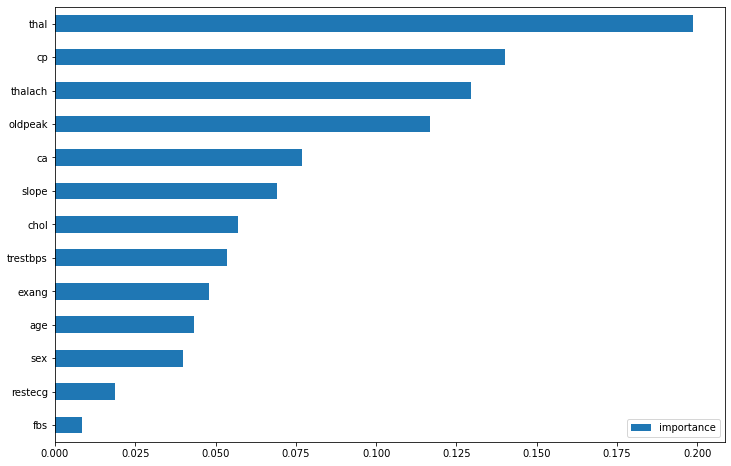

In [276]:
imp = pd.DataFrame(rf.feature_importances_, index=X.columns, columns=['importance'])
imp.sort_values('importance').plot(kind='barh', figsize=(12, 8))

In [277]:
import pandas as pd

df = pd.read_csv('training_mush.csv')
df

,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,...,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat,class
0,2,0,3,1,5,1,0,0,9,1,...,3,7,0,2,1,4,3,5,0,0
1,2,0,4,0,5,1,0,1,10,0,...,7,4,0,2,1,0,7,4,0,1
2,2,0,3,0,2,1,0,0,7,0,...,0,4,0,2,1,2,1,5,1,1
3,0,0,3,0,5,1,1,0,2,0,...,7,7,0,2,2,4,7,3,1,0
4,2,3,3,1,5,1,0,0,10,1,...,3,6,0,2,1,4,2,5,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6088,2,0,3,0,5,1,1,0,4,1,...,7,7,0,2,1,0,3,3,1,0
6089,3,2,2,0,2,1,0,1,0,1,...,6,7,0,2,1,0,7,4,0,1
6090,5,2,3,0,1,1,0,1,9,0,...,7,7,0,2,1,4,3,4,0,1
6091,3,2,3,0,5,1,1,0,2,0,...,7,7,0,2,2,4,7,3,1,0


In [282]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

clf_rf = RandomForestClassifier(random_state=0)
X = df.drop(columns='class')
y = df['class']
parameters = {'n_estimators': range(10,50,10), 'max_depth':range(1,12,2), 'min_samples_leaf': range(1,7), 'min_samples_split':range(2,9,2)}
search = GridSearchCV(clf_rf, parameters, cv=3, n_jobs=-1)
search.fit(X, y)
search.best_params_
feature_importances = search.best_estimator_.feature_importances_
feature_importances
pd.DataFrame({'features': list(X), 'feature_importances': feature_importances}).sort_values('feature_importances',ascending=False)


{'max_depth': 9,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 10}

In [284]:
feature_importances = search.best_estimator_.feature_importances_
feature_importances

array([0.00257742, 0.00312957, 0.02177298, 0.07010933, 0.18837641,
       0.        , 0.0808402 , 0.06846076, 0.10386114, 0.00756262,
       0.10379322, 0.03180155, 0.04829594, 0.01768932, 0.00625335,
       0.        , 0.0108812 , 0.0139101 , 0.07072612, 0.08356419,
       0.04378343, 0.02261118])

In [286]:
pd.DataFrame({'features': list(X), 'feature_importances': feature_importances}).sort_values('feature_importances',ascending=False)


,features,feature_importances
4,odor,0.188376
8,gill-color,0.103861
10,stalk-root,0.103793
19,spore-print-color,0.083564
6,gill-spacing,0.080840
18,ring-type,0.070726
3,bruises,0.070109
7,gill-size,0.068461
12,stalk-surface-below-ring,0.048296
20,population,0.043783


In [287]:
df_test = pd.read_csv('testing_mush.csv')
df_test

,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,...,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,0,3,8,1,3,1,0,0,4,0,...,2,7,7,0,2,1,4,2,3,3
1,5,3,4,1,5,1,0,0,10,1,...,2,6,6,0,2,1,4,3,5,0
2,3,3,4,0,8,1,0,1,0,1,...,2,7,6,0,2,1,0,7,4,4
3,3,2,2,0,7,1,0,1,0,1,...,1,6,7,0,2,1,0,7,4,0
4,3,2,2,0,8,1,0,1,0,1,...,1,6,6,0,2,1,0,7,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2026,3,3,2,0,2,1,0,1,0,1,...,1,7,7,0,2,1,0,7,4,2
2027,5,2,8,1,0,1,0,0,10,0,...,2,7,7,0,2,1,4,2,2,1
2028,5,3,3,0,2,1,0,0,3,0,...,1,6,0,0,2,1,2,1,4,4
2029,5,3,3,1,5,1,0,0,9,1,...,2,3,3,0,2,1,4,3,4,0


In [288]:
predictions = search.predict(df_test)
predictions

array([0, 0, 1, ..., 1, 0, 1], dtype=int64)

In [289]:
predictions.sum()

976

In [293]:
predictions.shape

(2031,)

In [295]:
predictions = search.predict(df_test)
pd.Series(predictions).value_counts()

0    1055
1     976
dtype: int64

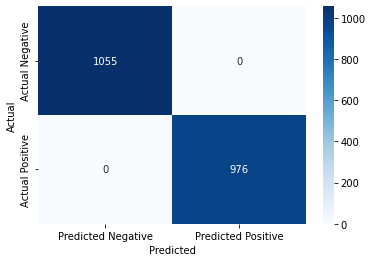

In [298]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
best_model = search.best_estimator_.predict(df_test)
cm = confusion_matrix(pd.read_csv('testing_y_mush.csv'),best_model)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['Predicted Negative', 'Predicted Positive'], yticklabels=['Actual Negative', 'Actual Positive'])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [301]:
y_pred = search.best_estimator_.predict(df_test)
y = pd.read_csv('testing_y_mush.csv')
cm = confusion_matrix(y, y_pred=y_pred)
cm

array([[1055,    0],
       [   0,  976]], dtype=int64)

<AxesSubplot: >

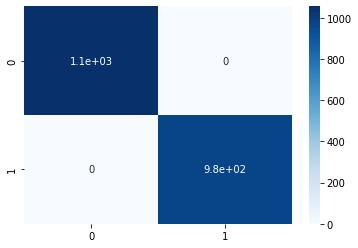

In [304]:
sns.heatmap(cm, annot=True, cmap='Blues')

In [306]:
df3 = pd.read_csv('invasion.csv')
df3

,class,g_reflection,i_reflection,speed,brightness,time_of_observance,volume
0,transport,2.190672,6.716633,62.168208,0.347465,158221,44.932446
1,transport,3.453276,8.995909,62.994707,0.590094,385972,41.568300
2,transport,2.432994,6.938691,62.245807,0.329288,446482,40.123467
3,fighter,6.083763,3.019459,18.474555,0.174738,210125,11.384865
4,fighter,12.876769,2.452950,195.805771,0.150446,23109,11.328806
...,...,...,...,...,...,...,...
495,fighter,9.901731,7.162124,58.095069,0.145065,395762,12.901909
496,transport,3.574132,7.118835,62.928159,0.469670,435926,39.926551
497,fighter,9.186049,4.580781,412.102112,0.108195,299594,12.178203
498,fighter,8.278256,8.353756,268.121561,0.132661,361911,13.905809


In [307]:
df4 = pd.read_csv('operative_information.csv')
df4

,g_reflection,i_reflection,speed,brightness,time_of_observance,volume
0,7.516543,3.916691,513.954279,0.177247,105908,13.267224
1,4.322988,6.967689,63.752970,0.545922,277855,39.833130
2,4.595724,9.098297,62.233948,0.389201,160662,42.014556
3,2.689675,7.964869,62.475495,0.541081,162092,42.056829
4,8.075576,5.169719,336.441261,0.174757,466853,11.779813
...,...,...,...,...,...,...
1495,11.755466,5.583147,325.069957,0.170644,388400,13.210917
1496,12.220137,4.023177,439.975574,0.163958,195305,13.819358
1497,1.611053,7.864930,65.025106,0.430021,307856,47.369083
1498,7.114131,5.532188,391.178342,0.150117,51590,12.447761


In [308]:
X = df3.drop(columns='class')
y = df3['class']
clf = DecisionTreeClassifier()
clf.fit(X,y)
predictions = clf.predict(df4)
predictions




array(['fighter', 'transport', 'transport', ..., 'transport', 'fighter',
       'transport'], dtype=object)

In [309]:
pd.Series(predictions).value_counts()

fighter      675
transport    596
cruiser      229
dtype: int64

In [310]:
clf.feature_importances_

array([0.34228808, 0.        , 0.        , 0.        , 0.        ,
       0.65771192])

In [311]:
feature_importances = clf.feature_importances_
feature_importances
pd.DataFrame({'features': list(X), 'feature_importances': feature_importances}).sort_values('feature_importances',ascending=False)

,features,feature_importances
5,volume,0.657712
0,g_reflection,0.342288
1,i_reflection,0.000000
2,speed,0.000000
3,brightness,0.000000
4,time_of_observance,0.000000


In [312]:
X

,g_reflection,i_reflection,speed,brightness,time_of_observance,volume
0,2.190672,6.716633,62.168208,0.347465,158221,44.932446
1,3.453276,8.995909,62.994707,0.590094,385972,41.568300
2,2.432994,6.938691,62.245807,0.329288,446482,40.123467
3,6.083763,3.019459,18.474555,0.174738,210125,11.384865
4,12.876769,2.452950,195.805771,0.150446,23109,11.328806
...,...,...,...,...,...,...
495,9.901731,7.162124,58.095069,0.145065,395762,12.901909
496,3.574132,7.118835,62.928159,0.469670,435926,39.926551
497,9.186049,4.580781,412.102112,0.108195,299594,12.178203
498,8.278256,8.353756,268.121561,0.132661,361911,13.905809


In [320]:
pd.DataFrame({'features': list(X), 'feature_importances':clf.feature_importances_}).sort_values('feature_importances', ascending=False)

,features,feature_importances
5,volume,0.657712
0,g_reflection,0.342288
1,i_reflection,0.000000
2,speed,0.000000
3,brightness,0.000000
4,time_of_observance,0.000000


In [45]:
df5 = pd.read_csv('space_can_be_a_dangerous_place.csv')
df5

,r,phi,peradventure_index,dustiness,black_hole_is_near,buggers_were_noticed,nearby_system_has_planemo,dangerous
0,169.1,138.0,22.3212,0.706285,0,1,1,1
1,11.1,148.0,1.4652,-0.410512,1,1,1,1
2,274.6,201.0,36.2472,0.756457,1,1,1,1
3,172.8,173.0,22.8096,0.035221,1,1,1,1
4,223.3,222.0,29.4756,0.197271,0,1,1,1
...,...,...,...,...,...,...,...,...
99995,301.7,249.0,39.8244,0.397064,0,1,1,1
99996,194.0,350.0,25.6080,-1.062202,0,1,1,1
99997,201.4,112.0,26.5848,1.571040,0,1,1,1
99998,7.8,115.0,1.0296,-1.206575,0,1,1,1


In [47]:
X = df5.drop(columns='dangerous')
y = df5.dangerous
clf = DecisionTreeClassifier()
clf.fit(X,y)

1    90202
0     9798
Name: dangerous, dtype: int64

In [324]:
X = df5.drop(columns='dangerous')
y = df5.dangerous
clf = DecisionTreeClassifier()
clf.fit(X,y)
clf.feature_importances_


array([0.15022677, 0.1713814 , 0.15853477, 0.30603033, 0.0038366 ,
       0.11865904, 0.0913311 ])

In [325]:
pd.DataFrame({'features': list(X), 'feature_importances': clf.feature_importances_}).sort_values('feature_importances', ascending=False)

,features,feature_importances
3,dustiness,0.306030
1,phi,0.171381
2,peradventure_index,0.158535
0,r,0.150227
5,buggers_were_noticed,0.118659
6,nearby_system_has_planemo,0.091331
4,black_hole_is_near,0.003837


In [44]:
df5

NameError: name 'df5' is not defined

In [49]:
import pandas as pd
from sklearn.metrics import roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import precision_score, recall_score

clf = DecisionTreeClassifier()
y_test = pd.read_csv('submission_data_test.csv')
df = pd.read_csv('events_data_test.csv')

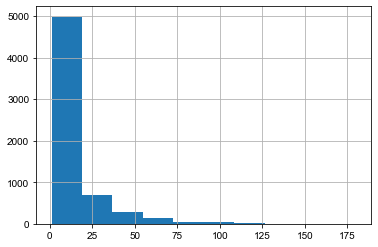

In [72]:
df[df.action == 'discovered'].groupby('user_id').step_id.count().hist()


<Figure size 1080x576 with 0 Axes>

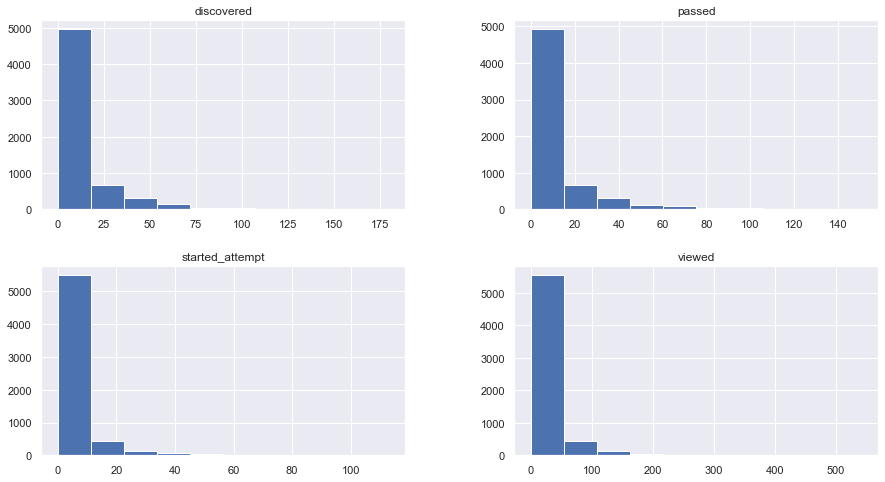

In [82]:
plt.figure(figsize=(15,8))
df.pivot_table(index='user_id', 
                columns='action', 
                values = 'step_id', 
                aggfunc='count', 
                fill_value=0).hist()
plt.show()


In [83]:
y_test.pivot_table(index='user_id', 
                columns='submission_status', 
                values='step_id', 
                aggfunc='count', 
                fill_value=0).reset_index()

submission_status,user_id,correct,wrong
0,12,1,0
1,13,29,36
2,15,10,30
3,21,24,103
4,35,7,35
...,...,...,...
2798,26775,46,160
2799,26780,16,7
2800,26785,3,1
2801,26796,2,3


In [84]:
df

,step_id,timestamp,action,user_id
0,30456,1526893787,viewed,24417
1,30456,1526893797,viewed,24417
2,30456,1526893954,viewed,24417
3,30456,1526895780,viewed,24417
4,30456,1526893787,discovered,24417
...,...,...,...,...
274763,158433,1545846175,discovered,3649
274764,158433,1545846175,passed,3649
274765,158433,1545846283,viewed,20953
274766,158433,1545846283,discovered,20953


<AxesSubplot: >

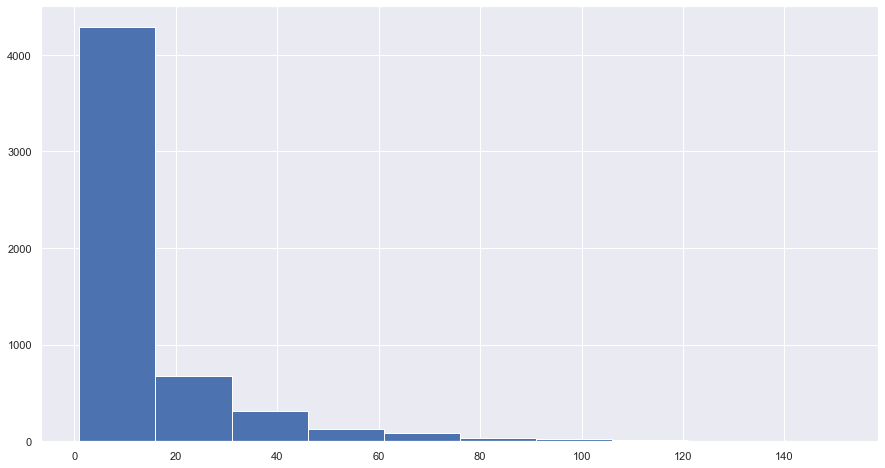

In [86]:
df[df.action == 'passed'].groupby('user_id').step_id.apply(len).hist()

In [98]:
filtered_df = df[df.action == 'passed'].groupby('user_id',as_index=False).step_id.nunique()
filtered_df

,user_id,step_id
0,4,1
1,6,1
2,10,2
3,12,9
4,13,70
...,...,...
5546,26785,4
5547,26791,1
5548,26795,1
5549,26796,4


In [100]:
filtered_df['passed'] = filtered_df.step_id > 40

In [103]:
filtered_df['passed'] = filtered_df.passed.apply(int)

In [106]:
filtered_df.drop(columns='step_id', inplace=True)

In [107]:
filtered_df

,user_id,passed
0,4,0
1,6,0
2,10,0
3,12,0
4,13,1
...,...,...
5546,26785,0
5547,26791,0
5548,26795,0
5549,26796,0


In [115]:
df_submissions = y_test.pivot_table(columns='submission_status', index='user_id', values='step_id', aggfunc='count', fill_value=0).reset_index()
df_submissions

submission_status,user_id,correct,wrong
0,12,1,0
1,13,29,36
2,15,10,30
3,21,24,103
4,35,7,35
...,...,...,...
2798,26775,46,160
2799,26780,16,7
2800,26785,3,1
2801,26796,2,3


In [131]:
prepared_sub = df_submissions.merge(filtered_df, on='user_id', how='outer').fillna(0).rename(columns={'passed':'finished_course'})
prepared_sub

,user_id,correct,wrong,finished_course
0,12,1.0,0.0,0.0
1,13,29.0,36.0,1.0
2,15,10.0,30.0,0.0
3,21,24.0,103.0,1.0
4,35,7.0,35.0,0.0
...,...,...,...,...
5563,26743,0.0,0.0,0.0
5564,26745,0.0,0.0,0.0
5565,26768,0.0,0.0,0.0
5566,26791,0.0,0.0,0.0


In [127]:
prepared_action = df.pivot_table(columns='action', index='user_id', values='step_id', aggfunc='count', fill_value=0)
prepared_action

action,discovered,passed,started_attempt,viewed
user_id,,,,
4,1,1,0,1
6,1,1,0,1
10,2,2,0,6
12,11,9,4,14
13,70,70,35,105
...,...,...,...,...
26791,1,1,0,1
26795,1,1,0,1
26796,6,4,2,12


In [134]:
final_df = prepared_action.merge(prepared_sub, on='user_id', how='outer').fillna(0)
final_df

,user_id,discovered,passed,started_attempt,viewed,correct,wrong,finished_course
0,4,1,1,0,1,0.0,0.0,0.0
1,6,1,1,0,1,0.0,0.0,0.0
2,10,2,2,0,6,0.0,0.0,0.0
3,12,11,9,4,14,1.0,0.0,0.0
4,13,70,70,35,105,29.0,36.0,1.0
...,...,...,...,...,...,...,...,...
6179,26791,1,1,0,1,0.0,0.0,0.0
6180,26795,1,1,0,1,0.0,0.0,0.0
6181,26796,6,4,2,12,2.0,3.0,0.0
6182,26799,6,6,2,6,2.0,0.0,0.0


In [135]:
y = final_df['finished_course']
X = final_df.drop('finished_course', axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y)

In [149]:
y.value_counts()

0.0    5816
1.0     368
Name: finished_course, dtype: int64

In [143]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix

In [144]:
rf = RandomForestClassifier(n_estimators=100, n_jobs=2, 
                            min_samples_leaf=10, min_samples_split=10, 
                            class_weight='balanced')

rf.fit(X_train, y_train)
pred_proba = rf.predict_proba(X_test)
roc_score = roc_auc_score(y_test, pred_proba[:, 1])


roc на test 1.0


In [159]:
fimp = pd.DataFrame({'Feature': X_train.columns, 'Importance': rf.feature_importances_}).sort_values('Importance', ascending=False)
fimp.head(15)

,Feature,Importance
2,passed,0.308492
1,discovered,0.255511
3,started_attempt,0.217295
4,viewed,0.101677
5,correct,0.084465
6,wrong,0.032299
0,user_id,0.000260


In [146]:
pred_proba

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [1., 0.],
       [1., 0.],
       [1., 0.]])

In [160]:
import pandas as pd

df = pd.read_csv('StudentsPerformance.csv')
df

,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score
0,female,group B,bachelor's degree,standard,none,72,72,74
1,female,group C,some college,standard,completed,69,90,88
2,female,group B,master's degree,standard,none,90,95,93
3,male,group A,associate's degree,free/reduced,none,47,57,44
4,male,group C,some college,standard,none,76,78,75
...,...,...,...,...,...,...,...,...
995,female,group E,master's degree,standard,completed,88,99,95
996,male,group C,high school,free/reduced,none,62,55,55
997,female,group C,high school,free/reduced,completed,59,71,65
998,female,group D,some college,standard,completed,68,78,77


In [167]:
df[(df['gender'] == 'female') & (df['race/ethnicity'] == 'group B')]

,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score
0,female,group B,bachelor's degree,standard,none,72,72,74
2,female,group B,master's degree,standard,none,90,95,93
5,female,group B,associate's degree,standard,none,71,83,78
6,female,group B,some college,standard,completed,88,95,92
9,female,group B,high school,free/reduced,none,38,60,50
...,...,...,...,...,...,...,...,...
923,female,group B,associate's degree,free/reduced,none,54,65,65
944,female,group B,high school,standard,none,58,68,61
969,female,group B,bachelor's degree,standard,none,75,84,80
980,female,group B,high school,free/reduced,none,8,24,23


In [164]:
df.groupby('lunch').agg('mean')

C:\Users\User\AppData\Local\Temp\ipykernel_22620\832263426.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.groupby('lunch').agg('mean')


,math score,reading score,writing score
lunch,,,
free/reduced,58.921127,64.653521,63.022535
standard,70.034109,71.654264,70.823256


In [165]:
df.groupby('lunch').agg('var')

C:\Users\User\AppData\Local\Temp\ipykernel_22620\3089476412.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.var is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.groupby('lunch').agg('var')


,math score,reading score,writing score
lunch,,,
free/reduced,229.824270,221.871139,238.202881
standard,186.418089,191.285560,205.620887


In [174]:
df.columns.str.replace(' ','_')

Index(['gender', 'race/ethnicity', 'parental_level_of_education', 'lunch',
       'test_preparation_course', 'math_score', 'reading_score',
       'writing_score'],
      dtype='object')

In [191]:
df.filter(items='female', axis=0)

,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score


In [218]:
df2 = pd.read_csv('dota_hero_stats.csv')
df2.T

,0,1,2,3,4,5,6,7,8,9,...,107,108,109,110,111,112,113,114,115,116
Unnamed: 0,0,1,2,3,4,5,6,7,8,9,...,107,108,109,110,111,112,113,114,115,116
attack_type,Melee,Melee,Ranged,Melee,Ranged,Ranged,Melee,Melee,Ranged,Ranged,...,Melee,Ranged,Ranged,Ranged,Ranged,Melee,Ranged,Melee,Ranged,Melee
id,1,2,3,4,5,6,7,8,9,10,...,109,110,111,112,113,114,119,120,121,129
legs,2,2,4,2,2,2,2,2,2,0,...,2,2,2,2,2,2,2,2,2,2
localized_name,Anti-Mage,Axe,Bane,Bloodseeker,Crystal Maiden,Drow Ranger,Earthshaker,Juggernaut,Mirana,Morphling,...,Terrorblade,Phoenix,Oracle,Winter Wyvern,Arc Warden,Monkey King,Dark Willow,Pangolier,Grimstroke,Mars
name,npc_dota_hero_antimage,npc_dota_hero_axe,npc_dota_hero_bane,npc_dota_hero_bloodseeker,npc_dota_hero_crystal_maiden,npc_dota_hero_drow_ranger,npc_dota_hero_earthshaker,npc_dota_hero_juggernaut,npc_dota_hero_mirana,npc_dota_hero_morphling,...,npc_dota_hero_terrorblade,npc_dota_hero_phoenix,npc_dota_hero_oracle,npc_dota_hero_winter_wyvern,npc_dota_hero_arc_warden,npc_dota_hero_monkey_king,npc_dota_hero_dark_willow,npc_dota_hero_pangolier,npc_dota_hero_grimstroke,npc_dota_hero_mars
primary_attr,agi,str,int,agi,int,agi,str,agi,agi,agi,...,agi,str,int,int,agi,agi,int,agi,int,str
roles,"['Carry', 'Escape', 'Nuker']","['Initiator', 'Durable', 'Disabler', 'Jungler']","['Support', 'Disabler', 'Nuker', 'Durable']","['Carry', 'Disabler', 'Jungler', 'Nuker', 'Ini...","['Support', 'Disabler', 'Nuker', 'Jungler']","['Carry', 'Disabler', 'Pusher']","['Support', 'Initiator', 'Disabler', 'Nuker']","['Carry', 'Pusher', 'Escape']","['Carry', 'Support', 'Escape', 'Nuker', 'Disab...","['Carry', 'Escape', 'Durable', 'Nuker', 'Disab...",...,"['Carry', 'Pusher', 'Nuker']","['Support', 'Nuker', 'Initiator', 'Escape', 'D...","['Support', 'Nuker', 'Disabler', 'Escape']","['Support', 'Disabler', 'Nuker']","['Carry', 'Escape', 'Nuker']","['Carry', 'Escape', 'Disabler', 'Initiator']","['Support', 'Nuker', 'Disabler', 'Escape']","['Carry', 'Nuker', 'Disabler', 'Durable', 'Esc...","['Support', 'Nuker', 'Disabler', 'Escape']","['Carry', 'Initiator', 'Disabler', 'Durable']"


In [220]:
df2.groupby(['attack_type', 'primary_attr']).count()

Unnamed: 0  id  legs  localized_name  name  roles
attack_type primary_attr                                                   
Melee       agi                   19  19    19              19    19     19
            int                    2   2     2               2     2      2
            str                   35  35    35              35    35     35
Ranged      agi                   18  18    18              18    18     18
            int                   40  40    40              40    40     40
            str                    3   3     3               3     3      3

In [196]:
selected_columns = df.filter(like='-')
selected_columns

""
0
1
2
3
4
...
995
996
997
998


In [2]:
import pandas as pd
df3 = pd.read_csv('http://stepik.org/media/attachments/course/4852/algae.csv')
df3

,species,genus,group,sucrose,alanin,citrate,glucose,oleic_acid
0,Fucus_vesiculosus,Fucus,brown,3.001472,3.711498,5.004262,2.548459,6.405165
1,Saccharina_japonica,Saccharina,brown,6.731070,1.255251,5.621499,6.013219,4.156700
2,Fucus_serratus,Fucus,brown,3.276870,0.346431,1.216767,3.623225,0.304573
3,Fucus_distichus,Fucus,brown,6.786996,6.641303,6.423606,2.272724,3.393203
4,Cladophora_fracta,Cladophora,green,3.861470,1.648450,6.940588,2.316955,2.528886
5,Cladophora_compacta,Cladophora,green,5.712284,3.461692,3.082826,3.343707,1.432514
6,Cladophora_gracilis,Cladophora,green,2.452623,6.881024,5.841520,2.740165,2.829016
7,Palmaria_palmata,Palmaria,red,0.704580,3.176440,5.573905,3.242090,2.245538
8,Saccharina_latissima,Saccharina,brown,1.636122,5.793163,1.071920,3.947968,4.817804
9,Ascophyllum_nodosum,Ascophyllum,brown,6.825467,0.875429,5.253527,3.414961,2.432526


In [10]:
df3.shape

(10, 8)

In [9]:
df3[df3['species'].str.contains('Fucus')]

,species,genus,group,sucrose,alanin,citrate,glucose,oleic_acid
0,Fucus_vesiculosus,Fucus,brown,3.001472,3.711498,5.004262,2.548459,6.405165
2,Fucus_serratus,Fucus,brown,3.276870,0.346431,1.216767,3.623225,0.304573
3,Fucus_distichus,Fucus,brown,6.786996,6.641303,6.423606,2.272724,3.393203


In [21]:
df3.groupby('genus').max().round(2)

,species,group,sucrose,alanin,citrate,glucose,oleic_acid
genus,,,,,,,
Ascophyllum,Ascophyllum_nodosum,brown,6.83,0.88,5.25,3.41,2.43
Cladophora,Cladophora_gracilis,green,5.71,6.88,6.94,3.34,2.83
Fucus,Fucus_vesiculosus,brown,6.79,6.64,6.42,3.62,6.41
Palmaria,Palmaria_palmata,red,0.70,3.18,5.57,3.24,2.25
Saccharina,Saccharina_latissima,brown,6.73,5.79,5.62,6.01,4.82


In [30]:
df3.groupby('genus').agg(['min','max','mean']).round(2).alanin

C:\Users\User\AppData\Local\Temp\ipykernel_4840\3139096945.py:1: FutureWarning: ['species', 'group'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  df3.groupby('genus').agg(['min','max','mean']).round(2).alanin


,min,max,mean
genus,,,
Ascophyllum,0.88,0.88,0.88
Cladophora,1.65,6.88,4.00
Fucus,0.35,6.64,3.57
Palmaria,3.18,3.18,3.18
Saccharina,1.26,5.79,3.52


In [41]:
df_new = pd.read_csv('dataset_209770_6.txt', delimiter=' ')
df_new

,x,y
0,584.447604,1190.891167
1,795.037934,799.074144
2,501.846016,109.121108
3,691.386705,1090.105907
4,601.979613,1194.606957
...,...,...
95,1381.915368,298.647891
96,287.764946,1300.554975
97,1412.389662,312.842627
98,806.161565,795.824705


<AxesSubplot: >

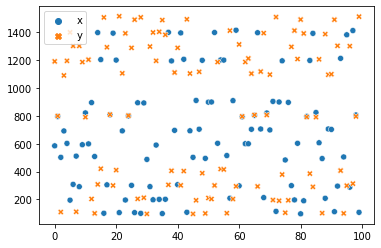

In [43]:
import seaborn as sns
sns.scatterplot(df_new)

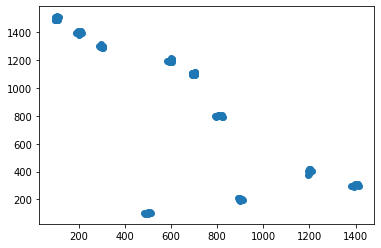

In [55]:
import matplotlib.pyplot as plt
plt.scatter(df_new.x, df_new.y)
plt.show()

In [59]:
df_n = pd.read_csv('genome_matrix.csv')
df_n.drop(columns='Unnamed: 0', inplace=True)

AttributeError: 'DataFrame' object has no attribute 'xaxis'

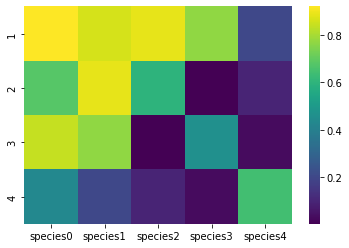

In [63]:
sns.heatmap(df_n[1:],cmap="viridis")
#g = # ваш код для создания теплокарты, укажите параметр cmap="viridis" для той же цветовой схемы
df_n.xaxis.set_ticks_position('top')
df_n.xaxis.set_tick_params(rotation=90)

In [64]:
role = pd.read_csv('https://stepik.org/media/attachments/course/4852/dota_hero_stats.csv')
role

,Unnamed: 0,attack_type,id,legs,localized_name,name,primary_attr,roles
0,0,Melee,1,2,Anti-Mage,npc_dota_hero_antimage,agi,"['Carry', 'Escape', 'Nuker']"
1,1,Melee,2,2,Axe,npc_dota_hero_axe,str,"['Initiator', 'Durable', 'Disabler', 'Jungler']"
2,2,Ranged,3,4,Bane,npc_dota_hero_bane,int,"['Support', 'Disabler', 'Nuker', 'Durable']"
3,3,Melee,4,2,Bloodseeker,npc_dota_hero_bloodseeker,agi,"['Carry', 'Disabler', 'Jungler', 'Nuker', 'Ini..."
4,4,Ranged,5,2,Crystal Maiden,npc_dota_hero_crystal_maiden,int,"['Support', 'Disabler', 'Nuker', 'Jungler']"
...,...,...,...,...,...,...,...,...
112,112,Melee,114,2,Monkey King,npc_dota_hero_monkey_king,agi,"['Carry', 'Escape', 'Disabler', 'Initiator']"
113,113,Ranged,119,2,Dark Willow,npc_dota_hero_dark_willow,int,"['Support', 'Nuker', 'Disabler', 'Escape']"
114,114,Melee,120,2,Pangolier,npc_dota_hero_pangolier,agi,"['Carry', 'Nuker', 'Disabler', 'Durable', 'Esc..."
115,115,Ranged,121,2,Grimstroke,npc_dota_hero_grimstroke,int,"['Support', 'Nuker', 'Disabler', 'Escape']"


<AxesSubplot: >

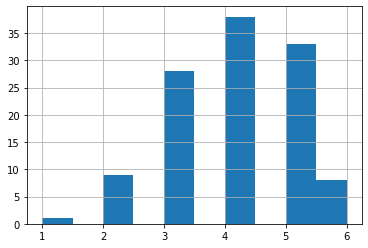

In [75]:
role.roles.str.split(',').apply(len).hist()

In [76]:
role.roles.apply(lambda k: len(eval(k)))

0      3
1      4
2      4
3      5
4      4
      ..
112    4
113    4
114    6
115    4
116    4
Name: roles, Length: 117, dtype: int64

In [80]:
dist_sample = pd.read_csv('iris (1).csv', index_col=0)
dist_sample

,sepal length,sepal width,petal length,petal width,species
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2
146,6.3,2.5,5.0,1.9,2
147,6.5,3.0,5.2,2.0,2
148,6.2,3.4,5.4,2.3,2


<AxesSubplot: ylabel='Density'>

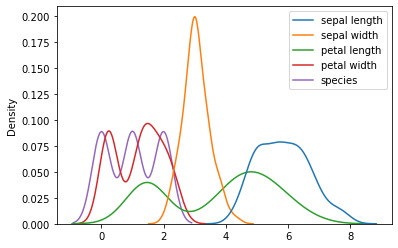

In [81]:
sns.kdeplot(dist_sample)

C:\Users\User\AppData\Local\Temp\ipykernel_4840\3658108061.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dist_sample)


<AxesSubplot: ylabel='Density'>

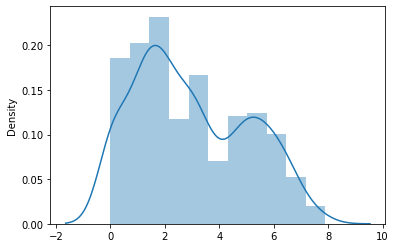

In [82]:
sns.distplot(dist_sample)

<AxesSubplot: >

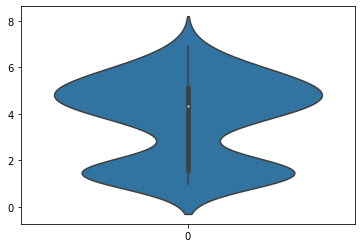

In [83]:
sns.violinplot(dist_sample['petal length'])

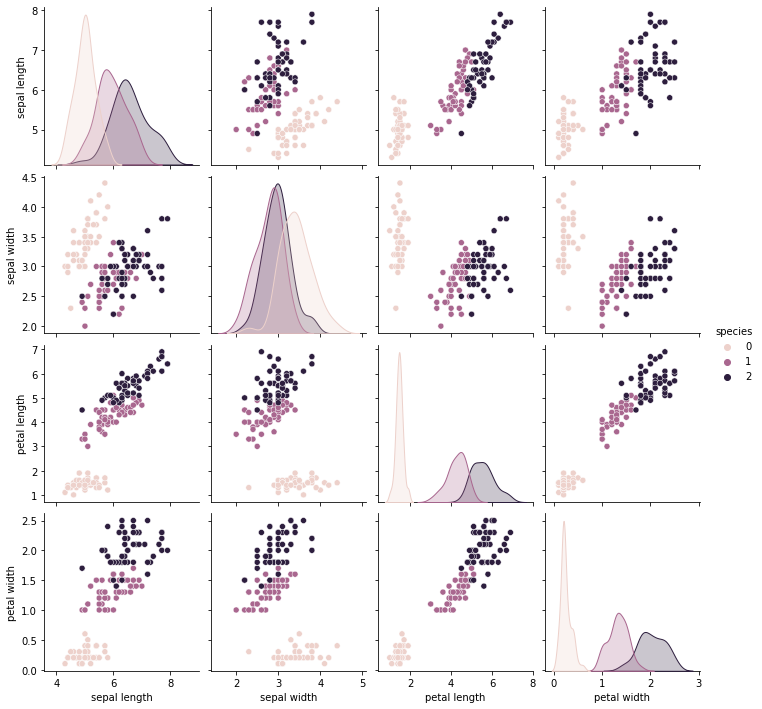

In [87]:
sns.pairplot(dist_sample, hue='species')

In [100]:
dogs_df = pd.read_csv('https://stepik.org/media/attachments/course/4852/cats.csv', index_col=0)
dogs_df

,Шерстист,Гавкает,Лазает по деревьям,Вид
0,1,1,0,собачка
1,1,1,0,собачка
2,1,1,0,собачка
3,1,1,0,собачка
4,1,0,1,котик
5,1,0,1,котик
6,1,0,1,котик
7,1,0,1,котик
8,1,1,1,котик
9,0,0,1,котик


In [101]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
clf = DecisionTreeClassifier(criterion='entropy')
X = dogs_df.drop(columns='Вид')
y = dogs_df['Вид']
clf.fit(X, y)
clf.feature_importances_


array([0., 0., 1.])

In [97]:
feature_importances = clf.feature_importances_
pd.DataFrame({'features': list(X), 'feature_importances': feature_importances}).sort_values('feature_importances',ascending=False)

,features,feature_importances
2,Лазает по деревьям,1.0
0,Шерстист,0.0
1,Гавкает,0.0


[Text(0.5, 0.75, 'Лазает по деревьям <= 0.5\nentropy = 0.971\nsamples = 10\nvalue = [6, 4]'),
 Text(0.25, 0.25, 'entropy = 0.0\nsamples = 4\nvalue = [0, 4]'),
 Text(0.75, 0.25, 'entropy = 0.0\nsamples = 6\nvalue = [6, 0]')]

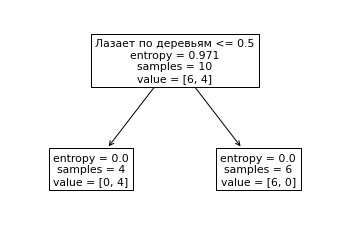

In [102]:
tree.plot_tree(clf, feature_names=X.columns)

In [1]:
import pandas as pd
df = pd.read_csv('https://stepik.org/media/attachments/course/4852/my_stat.csv')

In [2]:
df

,V1,V2,V3,V4
0,2,13.0,B,1.0
1,-1,7.0,B,1.0
2,0,11.0,A,0.0
3,2,11.0,A,2.0
4,0,10.0,B,-1.0
...,...,...,...,...
495,1,8.0,A,-1.0
496,3,8.0,A,1.0
497,-1,11.0,B,2.0
498,1,11.0,A,2.0


In [7]:
df.loc[:2]

,V1,V2,V3,V4
0,2,13.0,B,1.0
1,-1,7.0,B,1.0
2,0,11.0,A,0.0


In [21]:
df.loc[:10, ['V2','V4']]

,V2,V4
0,13.0,1.0
1,7.0,1.0
2,11.0,0.0
3,11.0,2.0
4,10.0,-1.0
5,11.0,0.0
6,9.0,2.0
7,9.0,1.0
8,9.0,2.0
9,10.0,0.0


In [22]:
df[['V2', 'V4']].drop([0, 4])

,V2,V4
1,7.0,1.0
2,11.0,0.0
3,11.0,2.0
5,11.0,0.0
6,9.0,2.0
...,...,...
495,8.0,-1.0
496,8.0,1.0
497,11.0,2.0
498,11.0,2.0


In [24]:
df.loc[:,['V2', 'V4']].drop([0, 4])

,V2,V4
1,7.0,1.0
2,11.0,0.0
3,11.0,2.0
5,11.0,0.0
6,9.0,2.0
...,...,...
495,8.0,-1.0
496,8.0,1.0
497,11.0,2.0
498,11.0,2.0


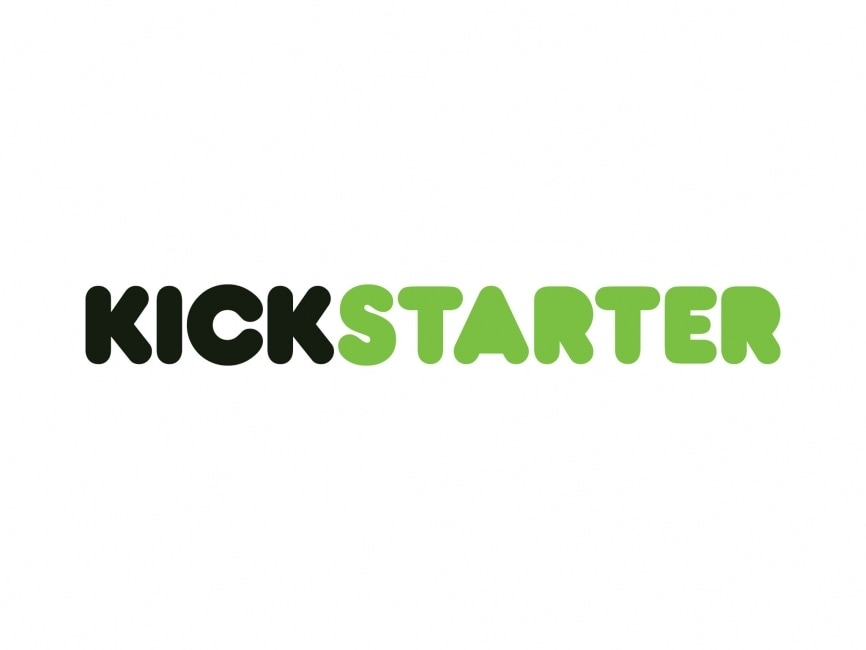

In [3]:
from IPython.display import Image
import pandas as pd
import numpy as np

Image(filename='114_kickstarter_logo.jpg')

In [43]:
df = pd.read_csv(r"C:\Users\User\Downloads\247324\1\ks.csv", parse_dates=['Дедлайн', 'Дата публикации'])
df

,Название,Категория,Главная категория,Валюта,Дедлайн,Дата публикации,Состояние,Инвесторов,Страна,Собрано в долларах,Цель в долларах
0,"Don't Call it a Comeback ""Telescopes""",Music,Music,USD,2013-01-10,2012-12-09 06:03:52,successful,23,US,600.00,600.00
1,Arcade County (Canceled),Games,Games,USD,2012-04-29,2012-03-30 23:40:45,canceled,5,US,71.00,9000.00
2,Hayashi Skate Co. Solar Skateboard backpack,Accessories,Fashion,CAD,2017-07-22,2017-05-23 23:00:13,canceled,8,CA,360.36,2391.77
3,Me & You Coordinating Sunglasses- Optical Qual...,Accessories,Fashion,USD,2016-11-18,2016-10-19 22:06:41,failed,20,US,502.00,10000.00
4,New Carts for Istanbul Street Food Vendors,Food,Food,USD,2015-05-17,2015-04-17 18:10:47,successful,62,US,2414.00,1400.00
...,...,...,...,...,...,...,...,...,...,...,...
378656,Kitten Mittens - is your cat making too much N...,Knitting,Crafts,NZD,2016-11-23,2016-10-24 21:08:37,suspended,0,NZ,0.00,48.59
378657,TurnAround//The End Needs A Beginning Album Re...,Rock,Music,GBP,2013-05-15,2013-04-15 19:09:37,failed,0,GB,0.00,2501.45
378658,Celtic inspired band looking to move forward w...,Rock,Music,USD,2011-04-29,2011-03-29 03:11:40,failed,0,US,0.00,1500.00
378659,Listening & Speaking in Virtual Reality: 5 Int...,Software,Technology,USD,2014-05-09,2014-04-30 02:45:45,failed,1,US,200.00,67000.00


In [44]:
data = df[df['Состояние'].isin(['successful', 'failed'])]
data

,Название,Категория,Главная категория,Валюта,Дедлайн,Дата публикации,Состояние,Инвесторов,Страна,Собрано в долларах,Цель в долларах
0,"Don't Call it a Comeback ""Telescopes""",Music,Music,USD,2013-01-10,2012-12-09 06:03:52,successful,23,US,600.00,600.00
3,Me & You Coordinating Sunglasses- Optical Qual...,Accessories,Fashion,USD,2016-11-18,2016-10-19 22:06:41,failed,20,US,502.00,10000.00
4,New Carts for Istanbul Street Food Vendors,Food,Food,USD,2015-05-17,2015-04-17 18:10:47,successful,62,US,2414.00,1400.00
5,New Improv Comedy Venue in Des Moines,Theater,Theater,USD,2013-06-17,2013-05-03 16:17:21,successful,86,US,10030.88,10000.00
6,The Seer and the Sword,Shorts,Film & Video,USD,2012-08-11,2012-07-12 05:19:53,failed,0,US,0.00,10000.00
...,...,...,...,...,...,...,...,...,...,...,...
378655,Launch Ladies - A children's book about the Wo...,Children's Books,Publishing,USD,2017-04-20,2017-03-21 16:00:45,successful,555,US,18808.00,9000.00
378657,TurnAround//The End Needs A Beginning Album Re...,Rock,Music,GBP,2013-05-15,2013-04-15 19:09:37,failed,0,GB,0.00,2501.45
378658,Celtic inspired band looking to move forward w...,Rock,Music,USD,2011-04-29,2011-03-29 03:11:40,failed,0,US,0.00,1500.00
378659,Listening & Speaking in Virtual Reality: 5 Int...,Software,Technology,USD,2014-05-09,2014-04-30 02:45:45,failed,1,US,200.00,67000.00


In [45]:
data.loc[data['Состояние'] == 'failed', 'target'] = 0
data

C:\Users\User\AppData\Local\Temp\ipykernel_640\3691718653.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[data['Состояние'] == 'failed', 'target'] = 0


,Название,Категория,Главная категория,Валюта,Дедлайн,Дата публикации,Состояние,Инвесторов,Страна,Собрано в долларах,Цель в долларах,target
0,"Don't Call it a Comeback ""Telescopes""",Music,Music,USD,2013-01-10,2012-12-09 06:03:52,successful,23,US,600.00,600.00,NaN
3,Me & You Coordinating Sunglasses- Optical Qual...,Accessories,Fashion,USD,2016-11-18,2016-10-19 22:06:41,failed,20,US,502.00,10000.00,0.0
4,New Carts for Istanbul Street Food Vendors,Food,Food,USD,2015-05-17,2015-04-17 18:10:47,successful,62,US,2414.00,1400.00,NaN
5,New Improv Comedy Venue in Des Moines,Theater,Theater,USD,2013-06-17,2013-05-03 16:17:21,successful,86,US,10030.88,10000.00,NaN
6,The Seer and the Sword,Shorts,Film & Video,USD,2012-08-11,2012-07-12 05:19:53,failed,0,US,0.00,10000.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
378655,Launch Ladies - A children's book about the Wo...,Children's Books,Publishing,USD,2017-04-20,2017-03-21 16:00:45,successful,555,US,18808.00,9000.00,NaN
378657,TurnAround//The End Needs A Beginning Album Re...,Rock,Music,GBP,2013-05-15,2013-04-15 19:09:37,failed,0,GB,0.00,2501.45,0.0
378658,Celtic inspired band looking to move forward w...,Rock,Music,USD,2011-04-29,2011-03-29 03:11:40,failed,0,US,0.00,1500.00,0.0
378659,Listening & Speaking in Virtual Reality: 5 Int...,Software,Technology,USD,2014-05-09,2014-04-30 02:45:45,failed,1,US,200.00,67000.00,0.0


In [46]:
data['target'] = data['target'].fillna(1)
data

C:\Users\User\AppData\Local\Temp\ipykernel_640\2102634172.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['target'] = data['target'].fillna(1)


,Название,Категория,Главная категория,Валюта,Дедлайн,Дата публикации,Состояние,Инвесторов,Страна,Собрано в долларах,Цель в долларах,target
0,"Don't Call it a Comeback ""Telescopes""",Music,Music,USD,2013-01-10,2012-12-09 06:03:52,successful,23,US,600.00,600.00,1.0
3,Me & You Coordinating Sunglasses- Optical Qual...,Accessories,Fashion,USD,2016-11-18,2016-10-19 22:06:41,failed,20,US,502.00,10000.00,0.0
4,New Carts for Istanbul Street Food Vendors,Food,Food,USD,2015-05-17,2015-04-17 18:10:47,successful,62,US,2414.00,1400.00,1.0
5,New Improv Comedy Venue in Des Moines,Theater,Theater,USD,2013-06-17,2013-05-03 16:17:21,successful,86,US,10030.88,10000.00,1.0
6,The Seer and the Sword,Shorts,Film & Video,USD,2012-08-11,2012-07-12 05:19:53,failed,0,US,0.00,10000.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
378655,Launch Ladies - A children's book about the Wo...,Children's Books,Publishing,USD,2017-04-20,2017-03-21 16:00:45,successful,555,US,18808.00,9000.00,1.0
378657,TurnAround//The End Needs A Beginning Album Re...,Rock,Music,GBP,2013-05-15,2013-04-15 19:09:37,failed,0,GB,0.00,2501.45,0.0
378658,Celtic inspired band looking to move forward w...,Rock,Music,USD,2011-04-29,2011-03-29 03:11:40,failed,0,US,0.00,1500.00,0.0
378659,Listening & Speaking in Virtual Reality: 5 Int...,Software,Technology,USD,2014-05-09,2014-04-30 02:45:45,failed,1,US,200.00,67000.00,0.0


In [47]:
data.rename(columns={'таргет2':'target_2'},inplace=True)
data

C:\Users\User\AppData\Local\Temp\ipykernel_640\4238849896.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.rename(columns={'таргет2':'target_2'},inplace=True)


,Название,Категория,Главная категория,Валюта,Дедлайн,Дата публикации,Состояние,Инвесторов,Страна,Собрано в долларах,Цель в долларах,target
0,"Don't Call it a Comeback ""Telescopes""",Music,Music,USD,2013-01-10,2012-12-09 06:03:52,successful,23,US,600.00,600.00,1.0
3,Me & You Coordinating Sunglasses- Optical Qual...,Accessories,Fashion,USD,2016-11-18,2016-10-19 22:06:41,failed,20,US,502.00,10000.00,0.0
4,New Carts for Istanbul Street Food Vendors,Food,Food,USD,2015-05-17,2015-04-17 18:10:47,successful,62,US,2414.00,1400.00,1.0
5,New Improv Comedy Venue in Des Moines,Theater,Theater,USD,2013-06-17,2013-05-03 16:17:21,successful,86,US,10030.88,10000.00,1.0
6,The Seer and the Sword,Shorts,Film & Video,USD,2012-08-11,2012-07-12 05:19:53,failed,0,US,0.00,10000.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
378655,Launch Ladies - A children's book about the Wo...,Children's Books,Publishing,USD,2017-04-20,2017-03-21 16:00:45,successful,555,US,18808.00,9000.00,1.0
378657,TurnAround//The End Needs A Beginning Album Re...,Rock,Music,GBP,2013-05-15,2013-04-15 19:09:37,failed,0,GB,0.00,2501.45,0.0
378658,Celtic inspired band looking to move forward w...,Rock,Music,USD,2011-04-29,2011-03-29 03:11:40,failed,0,US,0.00,1500.00,0.0
378659,Listening & Speaking in Virtual Reality: 5 Int...,Software,Technology,USD,2014-05-09,2014-04-30 02:45:45,failed,1,US,200.00,67000.00,0.0


In [48]:
data['time'] = data['Дедлайн'] - data['Дата публикации']

C:\Users\User\AppData\Local\Temp\ipykernel_640\856439444.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['time'] = data['Дедлайн'] - data['Дата публикации']


In [49]:
import datetime as dt
data.time = data.time.dt.days
data

C:\Users\User\AppData\Local\Temp\ipykernel_640\657732748.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.time = data.time.dt.days


,Название,Категория,Главная категория,Валюта,Дедлайн,Дата публикации,Состояние,Инвесторов,Страна,Собрано в долларах,Цель в долларах,target,time
0,"Don't Call it a Comeback ""Telescopes""",Music,Music,USD,2013-01-10,2012-12-09 06:03:52,successful,23,US,600.00,600.00,1.0,31
3,Me & You Coordinating Sunglasses- Optical Qual...,Accessories,Fashion,USD,2016-11-18,2016-10-19 22:06:41,failed,20,US,502.00,10000.00,0.0,29
4,New Carts for Istanbul Street Food Vendors,Food,Food,USD,2015-05-17,2015-04-17 18:10:47,successful,62,US,2414.00,1400.00,1.0,29
5,New Improv Comedy Venue in Des Moines,Theater,Theater,USD,2013-06-17,2013-05-03 16:17:21,successful,86,US,10030.88,10000.00,1.0,44
6,The Seer and the Sword,Shorts,Film & Video,USD,2012-08-11,2012-07-12 05:19:53,failed,0,US,0.00,10000.00,0.0,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...
378655,Launch Ladies - A children's book about the Wo...,Children's Books,Publishing,USD,2017-04-20,2017-03-21 16:00:45,successful,555,US,18808.00,9000.00,1.0,29
378657,TurnAround//The End Needs A Beginning Album Re...,Rock,Music,GBP,2013-05-15,2013-04-15 19:09:37,failed,0,GB,0.00,2501.45,0.0,29
378658,Celtic inspired band looking to move forward w...,Rock,Music,USD,2011-04-29,2011-03-29 03:11:40,failed,0,US,0.00,1500.00,0.0,30
378659,Listening & Speaking in Virtual Reality: 5 Int...,Software,Technology,USD,2014-05-09,2014-04-30 02:45:45,failed,1,US,200.00,67000.00,0.0,8


In [50]:
data['year_released'] = data['Дата публикации'].dt.year
data

C:\Users\User\AppData\Local\Temp\ipykernel_640\856870138.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['year_released'] = data['Дата публикации'].dt.year


,Название,Категория,Главная категория,Валюта,Дедлайн,Дата публикации,Состояние,Инвесторов,Страна,Собрано в долларах,Цель в долларах,target,time,year_released
0,"Don't Call it a Comeback ""Telescopes""",Music,Music,USD,2013-01-10,2012-12-09 06:03:52,successful,23,US,600.00,600.00,1.0,31,2012
3,Me & You Coordinating Sunglasses- Optical Qual...,Accessories,Fashion,USD,2016-11-18,2016-10-19 22:06:41,failed,20,US,502.00,10000.00,0.0,29,2016
4,New Carts for Istanbul Street Food Vendors,Food,Food,USD,2015-05-17,2015-04-17 18:10:47,successful,62,US,2414.00,1400.00,1.0,29,2015
5,New Improv Comedy Venue in Des Moines,Theater,Theater,USD,2013-06-17,2013-05-03 16:17:21,successful,86,US,10030.88,10000.00,1.0,44,2013
6,The Seer and the Sword,Shorts,Film & Video,USD,2012-08-11,2012-07-12 05:19:53,failed,0,US,0.00,10000.00,0.0,29,2012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378655,Launch Ladies - A children's book about the Wo...,Children's Books,Publishing,USD,2017-04-20,2017-03-21 16:00:45,successful,555,US,18808.00,9000.00,1.0,29,2017
378657,TurnAround//The End Needs A Beginning Album Re...,Rock,Music,GBP,2013-05-15,2013-04-15 19:09:37,failed,0,GB,0.00,2501.45,0.0,29,2013
378658,Celtic inspired band looking to move forward w...,Rock,Music,USD,2011-04-29,2011-03-29 03:11:40,failed,0,US,0.00,1500.00,0.0,30,2011
378659,Listening & Speaking in Virtual Reality: 5 Int...,Software,Technology,USD,2014-05-09,2014-04-30 02:45:45,failed,1,US,200.00,67000.00,0.0,8,2014


In [51]:
df2 = pd.read_excel(r"C:\Users\User\Downloads\247324\1\macrofeatures.xlsx")
df2 

,Unnamed: 0,Close_brent,Close_sugar,Close_cereals,Close_index_moex,Close_index_moex_10,Close_index_RGBI,Close_index_RTS_oil_and_gas,Close_index_RTS_metallurgy,Close_index_RTS_consumer_sector,Close_index_RTS_telecom,Close_index_RTS_finance,Close_index_RTS_transport,Close_index_RTS_chemicals,Close_index_RTS_broad_market,Close_index_RTS_electricity,dlk_cob_date
0,0,34.41,13.97,442.75,1797.27,3940.81,125.59,123.40,111.97,196.55,70.17,140.57,27.06,177.38,530.59,32.49,2016-02-24
1,1,35.06,14.24,445.25,1803.89,3977.35,126.44,124.22,112.51,198.03,70.56,142.64,27.43,179.48,536.20,33.07,2016-02-25
2,2,35.13,14.00,443.25,1816.73,4027.23,126.90,125.38,113.44,200.13,71.94,145.45,28.06,181.56,544.73,33.55,2016-02-26
3,3,36.64,14.36,445.00,1840.17,4084.24,126.87,126.69,114.66,200.32,72.41,147.22,28.49,186.76,552.82,34.41,2016-02-29
4,4,36.60,14.39,438.50,1844.17,4087.06,127.78,129.72,117.09,204.30,74.26,150.04,30.12,190.67,565.45,34.96,2016-03-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34050,34050,79.50,19.76,847.20,3872.77,5755.02,134.21,230.09,316.19,270.83,87.22,290.31,45.80,397.92,1192.39,69.47,2021-11-22
34051,34051,82.18,20.11,856.20,3960.33,5874.72,133.57,233.64,319.48,268.90,86.32,298.48,45.92,407.86,1217.91,69.40,2021-11-23
34052,34052,82.20,19.93,839.60,3950.56,5857.44,134.05,236.35,315.19,271.22,86.06,296.24,46.15,418.40,1217.14,69.75,2021-11-24
34053,34053,71.80,19.35,830.20,3810.98,5628.72,134.42,223.41,308.79,264.36,83.94,285.38,43.97,405.29,1165.12,67.23,2021-11-26


In [52]:
df_brent = df2[['Close_brent', 'dlk_cob_date']].drop_duplicates()
df_brent

,Close_brent,dlk_cob_date
0,34.41,2016-02-24
1,35.06,2016-02-25
2,35.13,2016-02-26
3,36.64,2016-02-29
4,36.60,2016-03-01
...,...,...
34050,79.50,2021-11-22
34051,82.18,2021-11-23
34052,82.20,2021-11-24
34053,71.80,2021-11-26


In [53]:
df_brent['dlk_cob_date'] = pd.to_datetime(df_brent.dlk_cob_date)
df_brent

,Close_brent,dlk_cob_date
0,34.41,2016-02-24
1,35.06,2016-02-25
2,35.13,2016-02-26
3,36.64,2016-02-29
4,36.60,2016-03-01
...,...,...
34050,79.50,2021-11-22
34051,82.18,2021-11-23
34052,82.20,2021-11-24
34053,71.80,2021-11-26


In [54]:
data['Дата публикации'] = data['Дата публикации'].astype('datetime64[ns]')
data['Дата публикации'] = data['Дата публикации'].dt.date

C:\Users\User\AppData\Local\Temp\ipykernel_640\2684899224.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Дата публикации'] = data['Дата публикации'].astype('datetime64[ns]')
C:\Users\User\AppData\Local\Temp\ipykernel_640\2684899224.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Дата публикации'] = data['Дата публикации'].dt.date


In [68]:
data['Дата публикации'] = data['Дата публикации'].astype('datetime64[ns]')
data['Дата публикации']


200855   2009-04-21
276057   2009-04-23
278951   2009-04-24
92182    2009-04-25
206673   2009-04-27
            ...    
282687   2017-12-23
363294   2017-12-26
301816   2017-12-27
335186   2017-12-28
26555    2017-12-29
Name: Дата публикации, Length: 331675, dtype: datetime64[ns]

In [69]:
data = data.merge(df_brent, left_on='Дата публикации', right_on='dlk_cob_date', how='left' )

In [70]:
data = data.sort_values('Дата публикации').fillna(method='ffill')
data

,Категория,Дедлайн,Дата публикации,Состояние,Собрано в долларах,Цель в долларах,target,time,year_released,Art,...,Food,Games,Journalism,Music,Photography,Publishing,Technology,Theater,Close_brent,dlk_cob_date
0,Fashion,2009-05-31,2009-04-21,failed,625.00,1000.00,0.0,39,2009,0,...,0,0,0,0,0,0,0,0,NaN,NaT
1,Shorts,2009-07-20,2009-04-23,failed,22.00,80000.00,0.0,87,2009,0,...,0,0,0,0,0,0,0,0,NaN,NaT
2,Illustration,2009-05-03,2009-04-24,successful,35.00,20.00,1.0,8,2009,1,...,0,0,0,0,0,0,0,0,NaN,NaT
3,Software,2009-07-14,2009-04-25,successful,145.00,99.00,1.0,79,2009,0,...,0,0,0,0,0,0,1,0,NaN,NaT
4,Fashion,2009-05-26,2009-04-27,failed,387.00,1900.00,0.0,28,2009,0,...,0,0,0,0,0,0,0,0,NaN,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331670,Games,2017-12-26,2017-12-23,successful,269.84,35.98,1.0,2,2017,0,...,0,1,0,0,0,0,0,0,65.25,2017-12-22
331671,Tabletop Games,2017-12-31,2017-12-26,successful,544.77,271.03,1.0,4,2017,0,...,0,1,0,0,0,0,0,0,66.46,2017-12-26
331672,Apparel,2017-12-31,2017-12-27,successful,202.00,200.00,1.0,3,2017,0,...,0,0,0,0,0,0,0,0,65.99,2017-12-27
331673,Tabletop Games,2017-12-30,2017-12-28,successful,265.00,250.00,1.0,1,2017,0,...,0,1,0,0,0,0,0,0,66.16,2017-12-28


In [71]:
data['Close_brent'] = data['Close_brent'].fillna('34.41')
data

,Категория,Дедлайн,Дата публикации,Состояние,Собрано в долларах,Цель в долларах,target,time,year_released,Art,...,Food,Games,Journalism,Music,Photography,Publishing,Technology,Theater,Close_brent,dlk_cob_date
0,Fashion,2009-05-31,2009-04-21,failed,625.00,1000.00,0.0,39,2009,0,...,0,0,0,0,0,0,0,0,34.41,NaT
1,Shorts,2009-07-20,2009-04-23,failed,22.00,80000.00,0.0,87,2009,0,...,0,0,0,0,0,0,0,0,34.41,NaT
2,Illustration,2009-05-03,2009-04-24,successful,35.00,20.00,1.0,8,2009,1,...,0,0,0,0,0,0,0,0,34.41,NaT
3,Software,2009-07-14,2009-04-25,successful,145.00,99.00,1.0,79,2009,0,...,0,0,0,0,0,0,1,0,34.41,NaT
4,Fashion,2009-05-26,2009-04-27,failed,387.00,1900.00,0.0,28,2009,0,...,0,0,0,0,0,0,0,0,34.41,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331670,Games,2017-12-26,2017-12-23,successful,269.84,35.98,1.0,2,2017,0,...,0,1,0,0,0,0,0,0,65.25,2017-12-22
331671,Tabletop Games,2017-12-31,2017-12-26,successful,544.77,271.03,1.0,4,2017,0,...,0,1,0,0,0,0,0,0,66.46,2017-12-26
331672,Apparel,2017-12-31,2017-12-27,successful,202.00,200.00,1.0,3,2017,0,...,0,0,0,0,0,0,0,0,65.99,2017-12-27
331673,Tabletop Games,2017-12-30,2017-12-28,successful,265.00,250.00,1.0,1,2017,0,...,0,1,0,0,0,0,0,0,66.16,2017-12-28


In [76]:
#data = data.drop(['Инвесторов','Название', 'Страна'], axis=1)
#data
data['Close_brent'] = data['Close_brent'].apply(float)
data.drop(['dlk_cob_date','Состояние'], axis=1, inplace=True)
data.dtypes

Категория                     object
Дедлайн               datetime64[ns]
Дата публикации       datetime64[ns]
Собрано в долларах           float64
Цель в долларах              float64
target                       float64
time                           int64
year_released                  int64
Art                            uint8
Comics                         uint8
Crafts                         uint8
Dance                          uint8
Design                         uint8
Fashion                        uint8
Film & Video                   uint8
Food                           uint8
Games                          uint8
Journalism                     uint8
Music                          uint8
Photography                    uint8
Publishing                     uint8
Technology                     uint8
Theater                        uint8
Close_brent                  float64
dtype: object

In [77]:
data

,Категория,Дедлайн,Дата публикации,Собрано в долларах,Цель в долларах,target,time,year_released,Art,Comics,...,Film & Video,Food,Games,Journalism,Music,Photography,Publishing,Technology,Theater,Close_brent
0,Fashion,2009-05-31,2009-04-21,625.00,1000.00,0.0,39,2009,0,0,...,0,0,0,0,0,0,0,0,0,34.41
1,Shorts,2009-07-20,2009-04-23,22.00,80000.00,0.0,87,2009,0,0,...,1,0,0,0,0,0,0,0,0,34.41
2,Illustration,2009-05-03,2009-04-24,35.00,20.00,1.0,8,2009,1,0,...,0,0,0,0,0,0,0,0,0,34.41
3,Software,2009-07-14,2009-04-25,145.00,99.00,1.0,79,2009,0,0,...,0,0,0,0,0,0,0,1,0,34.41
4,Fashion,2009-05-26,2009-04-27,387.00,1900.00,0.0,28,2009,0,0,...,0,0,0,0,0,0,0,0,0,34.41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331670,Games,2017-12-26,2017-12-23,269.84,35.98,1.0,2,2017,0,0,...,0,0,1,0,0,0,0,0,0,65.25
331671,Tabletop Games,2017-12-31,2017-12-26,544.77,271.03,1.0,4,2017,0,0,...,0,0,1,0,0,0,0,0,0,66.46
331672,Apparel,2017-12-31,2017-12-27,202.00,200.00,1.0,3,2017,0,0,...,0,0,0,0,0,0,0,0,0,65.99
331673,Tabletop Games,2017-12-30,2017-12-28,265.00,250.00,1.0,1,2017,0,0,...,0,0,1,0,0,0,0,0,0,66.16


In [59]:
pd.get_dummies(data['Валюта'])

,AUD,CAD,CHF,DKK,EUR,GBP,HKD,JPY,MXN,NOK,NZD,SEK,SGD,USD
200855,0,0,0,0,0,0,0,0,0,0,0,0,0,1
276057,0,0,0,0,0,0,0,0,0,0,0,0,0,1
278951,0,0,0,0,0,0,0,0,0,0,0,0,0,1
92182,0,0,0,0,0,0,0,0,0,0,0,0,0,1
206673,0,0,0,0,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282687,0,0,0,0,1,0,0,0,0,0,0,0,0,0
363294,0,0,0,0,0,1,0,0,0,0,0,0,0,0
301816,0,0,0,0,0,0,0,0,0,0,0,0,0,1
335186,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [60]:
data = pd.concat((data, pd.get_dummies(data_test['Валюта'])), axis=1)
data.drop('Валюта', axis=1)
data

NameError: name 'data_test' is not defined

In [61]:
data = pd.concat((data, pd.get_dummies(data['Главная категория'])), axis=1)
data.drop('Главная категория', axis=1,inplace=True)
data

,Категория,Валюта,Дедлайн,Дата публикации,Состояние,Собрано в долларах,Цель в долларах,target,time,year_released,...,Fashion,Film & Video,Food,Games,Journalism,Music,Photography,Publishing,Technology,Theater
200855,Fashion,USD,2009-05-31,2009-04-21,failed,625.00,1000.00,0.0,39,2009,...,1,0,0,0,0,0,0,0,0,0
276057,Shorts,USD,2009-07-20,2009-04-23,failed,22.00,80000.00,0.0,87,2009,...,0,1,0,0,0,0,0,0,0,0
278951,Illustration,USD,2009-05-03,2009-04-24,successful,35.00,20.00,1.0,8,2009,...,0,0,0,0,0,0,0,0,0,0
92182,Software,USD,2009-07-14,2009-04-25,successful,145.00,99.00,1.0,79,2009,...,0,0,0,0,0,0,0,0,1,0
206673,Fashion,USD,2009-05-26,2009-04-27,failed,387.00,1900.00,0.0,28,2009,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282687,Games,EUR,2017-12-26,2017-12-23,successful,269.84,35.98,1.0,2,2017,...,0,0,0,1,0,0,0,0,0,0
363294,Tabletop Games,GBP,2017-12-31,2017-12-26,successful,544.77,271.03,1.0,4,2017,...,0,0,0,1,0,0,0,0,0,0
301816,Apparel,USD,2017-12-31,2017-12-27,successful,202.00,200.00,1.0,3,2017,...,1,0,0,0,0,0,0,0,0,0
335186,Tabletop Games,USD,2017-12-30,2017-12-28,successful,265.00,250.00,1.0,1,2017,...,0,0,0,1,0,0,0,0,0,0


In [80]:
data['Категория'] = data['Категория'].map(data.groupby('Категория')['Собрано в долларах'].mean())
data

,Категория,Дедлайн,Дата публикации,Собрано в долларах,Цель в долларах,target,time,year_released,Art,Comics,...,Film & Video,Food,Games,Journalism,Music,Photography,Publishing,Technology,Theater,Close_brent
0,6035.989239,2009-05-31,2009-04-21,625.00,1000.00,0.0,39,2009,0,0,...,0,0,0,0,0,0,0,0,0,34.41
1,3591.033473,2009-07-20,2009-04-23,22.00,80000.00,0.0,87,2009,0,0,...,1,0,0,0,0,0,0,0,0,34.41
2,3661.424550,2009-05-03,2009-04-24,35.00,20.00,1.0,8,2009,1,0,...,0,0,0,0,0,0,0,0,0,34.41
3,4321.245721,2009-07-14,2009-04-25,145.00,99.00,1.0,79,2009,0,0,...,0,0,0,0,0,0,0,1,0,34.41
4,6035.989239,2009-05-26,2009-04-27,387.00,1900.00,0.0,28,2009,0,0,...,0,0,0,0,0,0,0,0,0,34.41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331670,7635.064778,2017-12-26,2017-12-23,269.84,35.98,1.0,2,2017,0,0,...,0,0,1,0,0,0,0,0,0,65.25
331671,38415.722876,2017-12-31,2017-12-26,544.77,271.03,1.0,4,2017,0,0,...,0,0,1,0,0,0,0,0,0,66.46
331672,6098.303122,2017-12-31,2017-12-27,202.00,200.00,1.0,3,2017,0,0,...,0,0,0,0,0,0,0,0,0,65.99
331673,38415.722876,2017-12-30,2017-12-28,265.00,250.00,1.0,1,2017,0,0,...,0,0,1,0,0,0,0,0,0,66.16


In [120]:
data['year_released'] = pd.to_datetime(data['year_released'], format='%Y').dt.date.year
data['year_released']
#data['time'] = pd.to_timedelta(data['time'], unit='D')


ValueError: unconverted data remains: -01-01

In [82]:
X = data.drop(['Цель в долларах'], axis=1)
X['Close_brent'] = X['Close_brent'].apply(float)
y = data['Цель в долларах']
X.dtypes

Категория                    float64
Дедлайн               datetime64[ns]
Дата публикации       datetime64[ns]
Собрано в долларах           float64
target                       float64
time                           int64
year_released                  int64
Art                            uint8
Comics                         uint8
Crafts                         uint8
Dance                          uint8
Design                         uint8
Fashion                        uint8
Film & Video                   uint8
Food                           uint8
Games                          uint8
Journalism                     uint8
Music                          uint8
Photography                    uint8
Publishing                     uint8
Technology                     uint8
Theater                        uint8
Close_brent                  float64
dtype: object

dtype('int64')

In [88]:
X['Дата публикации'] = X['Дата публикации'].dt.date.astype('datetime64[ns]')
X['Дедлайн'] = X['Дедлайн'].dt.date.astype('datetime64[ns]')
X.dtypes

Категория                    float64
Дедлайн               datetime64[ns]
Дата публикации       datetime64[ns]
Собрано в долларах           float64
target                       float64
time                           int64
year_released                  int64
Art                            uint8
Comics                         uint8
Crafts                         uint8
Dance                          uint8
Design                         uint8
Fashion                        uint8
Film & Video                   uint8
Food                           uint8
Games                          uint8
Journalism                     uint8
Music                          uint8
Photography                    uint8
Publishing                     uint8
Technology                     uint8
Theater                        uint8
Close_brent                  float64
dtype: object

In [93]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X, y)

X['Предсказание'] = model.predict(X)
X.head()

DTypePromotionError: The DType <class 'numpy.dtypes.DateTime64DType'> could not be promoted by <class 'numpy.dtypes.Float64DType'>. This means that no common DType exists for the given inputs. For example they cannot be stored in a single array unless the dtype is `object`. The full list of DTypes is: (<class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.DateTime64DType'>, <class 'numpy.dtypes.DateTime64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Float64DType'>, <class 'numpy.dtypes.Int64DType'>, <class 'numpy.dtypes.Int64DType'>, <class 'numpy.dtypes.UInt8DType'>, <class 'numpy.dtypes.UInt8DType'>, <class 'numpy.dtypes.UInt8DType'>, <class 'numpy.dtypes.UInt8DType'>, <class 'numpy.dtypes.UInt8DType'>, <class 'numpy.dtypes.UInt8DType'>, <class 'numpy.dtypes.UInt8DType'>, <class 'numpy.dtypes.UInt8DType'>, <class 'numpy.dtypes.UInt8DType'>, <class 'numpy.dtypes.UInt8DType'>, <class 'numpy.dtypes.UInt8DType'>, <class 'numpy.dtypes.UInt8DType'>, <class 'numpy.dtypes.UInt8DType'>, <class 'numpy.dtypes.UInt8DType'>, <class 'numpy.dtypes.UInt8DType'>, <class 'numpy.dtypes.Float64DType'>)

In [92]:
y = y.apply(int)

In [131]:
X.dtypes

Категория          float64
Состояние           object
Цель в долларах    float64
target             float64
time                 int64
year_released        int64
Close_brent        float64
AUD                  uint8
CAD                  uint8
CHF                  uint8
DKK                  uint8
EUR                  uint8
GBP                  uint8
HKD                  uint8
JPY                  uint8
MXN                  uint8
NOK                  uint8
NZD                  uint8
SEK                  uint8
SGD                  uint8
USD                  uint8
Art                  uint8
Comics               uint8
Crafts               uint8
Dance                uint8
Design               uint8
Fashion              uint8
Film & Video         uint8
Food                 uint8
Games                uint8
Journalism           uint8
Music                uint8
Photography          uint8
Publishing           uint8
Technology           uint8
Theater              uint8
Art                  uint8
C

In [2]:
df_new = pd.read_csv(r"C:\Users\User\Downloads\247324\1 дз taxi_dataset.csv")
df_new

NameError: name 'pd' is not defined

In [137]:
df_new.loc[df_new.store_and_fwd_flag == 'N', 'store_flag'] = 0

In [139]:
df_new.store_flag = df_new.store_flag.fillna(1)
df_new

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,store_flag
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,0.0
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,0.0
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,0.0
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,0.0
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,0.0
...,...,...,...,...,...,...,...,...,...,...,...
1458639,id2376096,2,2016-04-08 13:31:04,2016-04-08 13:44:02,4,-73.982201,40.745522,-73.994911,40.740170,N,0.0
1458640,id1049543,1,2016-01-10 07:35:15,2016-01-10 07:46:10,1,-74.000946,40.747379,-73.970184,40.796547,N,0.0
1458641,id2304944,2,2016-04-22 06:57:41,2016-04-22 07:10:25,1,-73.959129,40.768799,-74.004433,40.707371,N,0.0
1458642,id2714485,1,2016-01-05 15:56:26,2016-01-05 16:02:39,1,-73.982079,40.749062,-73.974632,40.757107,N,0.0


In [18]:
import pandas as pd

taxi_df = pd.read_csv('taxi_dataset_with_predictions.csv')

In [19]:
taxi_df

,id,vendor_id,pickup_datetime,passenger_count,store_and_fwd_flag,trip_duration,distance_km,prediction_1,prediction_2
0,id2875421,1,2016-03-14 17:24:55,930.399753,0,455.0,1.500479,578.156451,355.270710
1,id2377394,0,2016-06-12 00:43:35,930.399753,0,663.0,1.807119,962.657188,674.295781
2,id3858529,1,2016-01-19 11:35:24,930.399753,0,2124.0,6.392080,2546.180515,2422.132431
3,id3504673,1,2016-04-06 19:32:31,930.399753,0,429.0,1.487155,737.926214,795.992362
4,id2181028,1,2016-03-26 13:30:55,930.399753,0,435.0,1.189925,666.070794,-4.158492
...,...,...,...,...,...,...,...,...,...
1458639,id2376096,1,2016-04-08 13:31:04,1053.529749,0,778.0,1.226296,1090.926494,1230.540125
1458640,id1049543,0,2016-01-10 07:35:15,930.399753,0,655.0,6.056935,883.318745,1568.424070
1458641,id2304944,1,2016-04-22 06:57:41,930.399753,0,764.0,7.832952,1002.554003,780.697509
1458642,id2714485,0,2016-01-05 15:56:26,930.399753,0,373.0,1.093786,809.069587,641.495195


In [20]:
prepared_df = taxi_df.drop('pickup_datetime', axis=1)
prepared_df


,id,vendor_id,passenger_count,store_and_fwd_flag,trip_duration,distance_km,prediction_1,prediction_2
0,id2875421,1,930.399753,0,455.0,1.500479,578.156451,355.270710
1,id2377394,0,930.399753,0,663.0,1.807119,962.657188,674.295781
2,id3858529,1,930.399753,0,2124.0,6.392080,2546.180515,2422.132431
3,id3504673,1,930.399753,0,429.0,1.487155,737.926214,795.992362
4,id2181028,1,930.399753,0,435.0,1.189925,666.070794,-4.158492
...,...,...,...,...,...,...,...,...
1458639,id2376096,1,1053.529749,0,778.0,1.226296,1090.926494,1230.540125
1458640,id1049543,0,930.399753,0,655.0,6.056935,883.318745,1568.424070
1458641,id2304944,1,930.399753,0,764.0,7.832952,1002.554003,780.697509
1458642,id2714485,0,930.399753,0,373.0,1.093786,809.069587,641.495195


In [21]:
prepared_df.set_index('id',inplace=True)
prepared_df

,vendor_id,passenger_count,store_and_fwd_flag,trip_duration,distance_km,prediction_1,prediction_2
id,,,,,,,
id2875421,1,930.399753,0,455.0,1.500479,578.156451,355.270710
id2377394,0,930.399753,0,663.0,1.807119,962.657188,674.295781
id3858529,1,930.399753,0,2124.0,6.392080,2546.180515,2422.132431
id3504673,1,930.399753,0,429.0,1.487155,737.926214,795.992362
id2181028,1,930.399753,0,435.0,1.189925,666.070794,-4.158492
...,...,...,...,...,...,...,...
id2376096,1,1053.529749,0,778.0,1.226296,1090.926494,1230.540125
id1049543,0,930.399753,0,655.0,6.056935,883.318745,1568.424070
id2304944,1,930.399753,0,764.0,7.832952,1002.554003,780.697509


In [22]:
from sklearn.linear_model import LinearRegression
X = prepared_df.drop('trip_duration', axis=1)
y = prepared_df.trip_duration
model = LinearRegression()
model.fit(X,y)

LinearRegression()

In [23]:
model.coef_

array([ 2.69170003e-01, -4.31443347e-05,  3.61388238e-01,  2.80567495e-02,
        9.24304340e-01,  7.53319963e-02])

In [24]:
model.intercept_

-280.8953365319737

In [29]:
pd.DataFrame({'coef': list(X), 'numbers': model.coef_ }).sort_values('numbers', ascending=False)

,coef,numbers
4,prediction_1,0.924304
2,store_and_fwd_flag,0.361388
0,vendor_id,0.269170
5,prediction_2,0.075332
3,distance_km,0.028057
1,passenger_count,-0.000043


In [ ]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X, y)

X['Предсказание'] = model.predict(X)
X.head()

In [31]:
model.coef_

array([ 2.69170003e-01, -4.31443347e-05,  3.61388238e-01,  2.80567495e-02,
        9.24304340e-01,  7.53319963e-02])

In [30]:
model.intercept_

-280.8953365319737

In [34]:
import numpy as np
np.append(model.coef_,model.intercept_)

array([ 2.69170003e-01, -4.31443347e-05,  3.61388238e-01,  2.80567495e-02,
        9.24304340e-01,  7.53319963e-02, -2.80895337e+02])

In [49]:
def LinearRegressionbyMatrix(X, y, fit_intercept =True):
    import numpy as np
    model = LinearRegression()
    model.fit(X,y)
    temp_array = np.append(model.coef_, model.intercept_)
    return pd.DataFrame({'coef_name': list(X), 'coef_number':model.coef_}).sort_values('coef_number', ascending=False), temp_array, print('model_intercept:', model.intercept_)

In [50]:
LinearRegressionbyMatrix(X, y, fit_intercept=True)

model_intercept: -280.8953365319737


(            coef_name  coef_number
 4        prediction_1     0.924304
 2  store_and_fwd_flag     0.361388
 0           vendor_id     0.269170
 5        prediction_2     0.075332
 3         distance_km     0.028057
 1     passenger_count    -0.000043,
 array([ 2.69170003e-01, -4.31443347e-05,  3.61388238e-01,  2.80567495e-02,
         9.24304340e-01,  7.53319963e-02, -2.80895337e+02]),
 None)

In [1]:
import matplotlib.pyplot as plt

fig = plt.figure()
fig.set_size_inches(10, 8)

<Figure size 720x576 with 0 Axes>

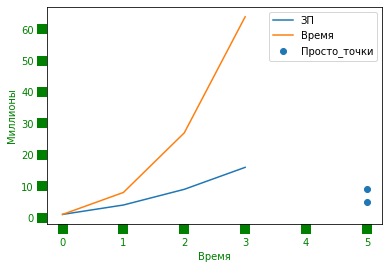

In [22]:
plt.plot([1, 4, 9, 16])
plt.plot([1, 8, 27, 64])
plt.scatter([5,5],[5,9])
plt.xlabel('Время', fontsize=10, color='green')
plt.ylabel('Миллионы', fontsize=10,  color='green')
plt.tick_params(colors='green', labelsize=10, length=10, width=10)
plt.legend(['ЗП', 'Время', 'Просто_точки'])

In [25]:
import numpy as np
np.linspace(-10,10,150)

array([-10.        ,  -9.86577181,  -9.73154362,  -9.59731544,
        -9.46308725,  -9.32885906,  -9.19463087,  -9.06040268,
        -8.9261745 ,  -8.79194631,  -8.65771812,  -8.52348993,
        -8.38926174,  -8.25503356,  -8.12080537,  -7.98657718,
        -7.85234899,  -7.71812081,  -7.58389262,  -7.44966443,
        -7.31543624,  -7.18120805,  -7.04697987,  -6.91275168,
        -6.77852349,  -6.6442953 ,  -6.51006711,  -6.37583893,
        -6.24161074,  -6.10738255,  -5.97315436,  -5.83892617,
        -5.70469799,  -5.5704698 ,  -5.43624161,  -5.30201342,
        -5.16778523,  -5.03355705,  -4.89932886,  -4.76510067,
        -4.63087248,  -4.4966443 ,  -4.36241611,  -4.22818792,
        -4.09395973,  -3.95973154,  -3.82550336,  -3.69127517,
        -3.55704698,  -3.42281879,  -3.2885906 ,  -3.15436242,
        -3.02013423,  -2.88590604,  -2.75167785,  -2.61744966,
        -2.48322148,  -2.34899329,  -2.2147651 ,  -2.08053691,
        -1.94630872,  -1.81208054,  -1.67785235,  -1.54

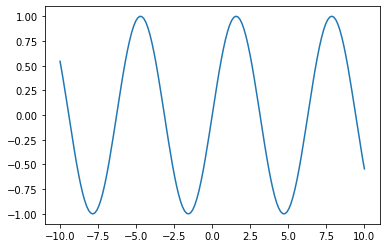

In [28]:
x = np.linspace(-10,10,150)
y = np.sin(x)

plt.plot(x,y)

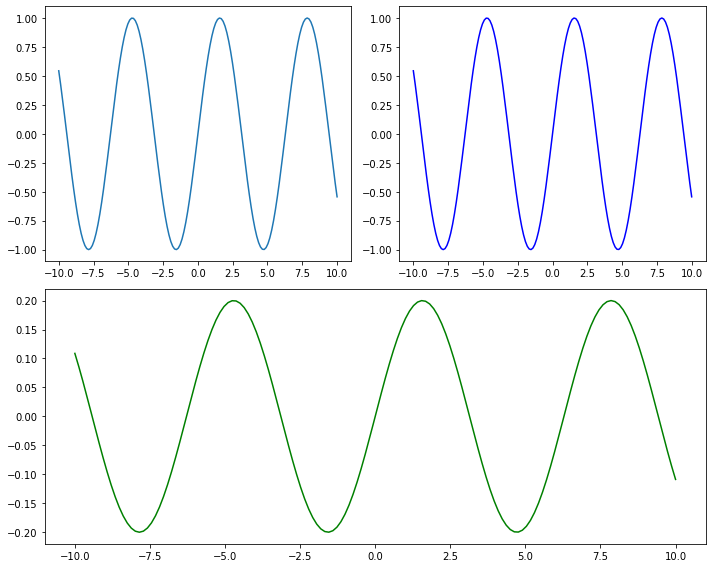

In [46]:
import matplotlib.pyplot as plt

fig = plt.figure()
fig.set_size_inches(10, 8)

plt.plot([1, 4, 9, 16])
plt.plot([1, 8, 27, 64])
plt.scatter([5,5],[5,9])
plt.xlabel('Время', fontsize=10, color='green')
plt.ylabel('Миллионы', fontsize=10,  color='green')
plt.tick_params(colors='green', labelsize=10, length=10, width=10)
plt.legend(['ЗП', 'Время', 'Просто_точки'])

fig = plt.figure()
fig.set_size_inches(10, 8)
ax1 = fig.add_subplot(2, 2, 1)
plt.plot(x, y)

ax3 = fig.add_subplot(2, 2, 2)
plt.plot(x, y, color='blue')

ax2 = fig.add_subplot(2, 1, 2)
plt.plot(x, y*0.2, color='green')
fig.tight_layout()
plt.show()

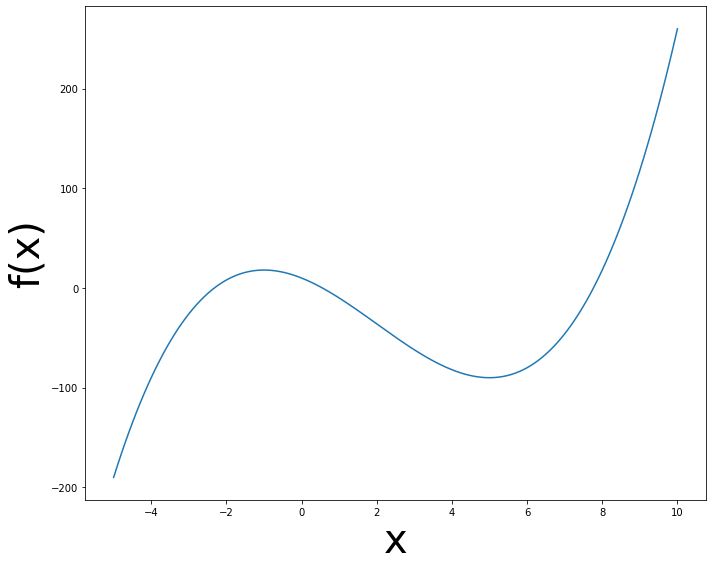

In [89]:
x = np.linspace(-5, 10, 150)
def func(x):
    return x**3 - 6*x**2 - 15*x + 10

fig = plt.figure()
fig.set_size_inches(10, 8)

plt.plot(x, func(x))
plt.ylabel('f(x)',fontsize=40)
plt.xlabel('x', fontsize=40)
plt.tick_params(colors='black')
fig.tight_layout()

Супер пупер, чиселко, циферка, графичек

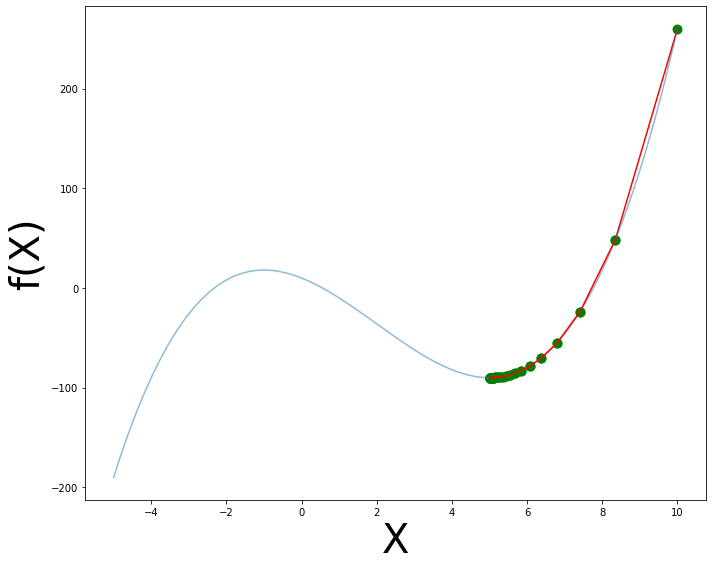

In [94]:
def derevative_func_x(x):
        return 3 * x**2 - 12*x - 15 

x = np.linspace(-5, 10, 150)
def decent_and_plot(X_start=10, learning_rate=0.01, threshold=0.001):
    X_start = X_start
    learning_rate = learning_rate
    threshold = threshold

    X_next = X_start - learning_rate * derevative_func_x(X_start)

    fig = plt.figure()
    fig.set_size_inches(10,8)

    plt.scatter([X_start, X_next], 
                [func(X_start), func(X_next)], 
                color='green', s=80)
    plt.plot([X_start, X_next], 
            [func(X_start), func(X_next)], 
            color='red')
    plt.plot(x, func(x), alpha=0.5)
    plt.xlabel('X', fontsize=40)
    plt.ylabel('f(X)', fontsize=40)
    fig.tight_layout()
    #plt.show()

    while abs(X_start - X_next) > threshold:
        X_start = X_next
        X_next = X_start - learning_rate * derevative_func_x(X_start)

        plt.scatter([X_start, X_next], 
                    [func(X_start), func(X_next)], 
                    color='green', s=80)
        plt.plot([X_start, X_next], [func(X_start), func(X_next)], color='red')
decent_and_plot()

OverflowError: (34, 'Result too large')

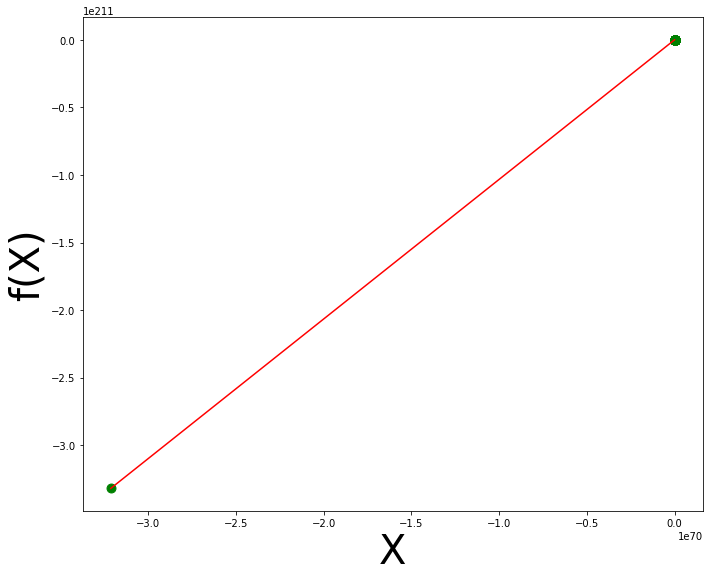

In [97]:
decent_and_plot(-2, 0.001,0.01)

In [100]:
data = {
    'col1': [1, 2, 3, 4, 5],
    'col2': [10, 20, 30, 40, 50],
    # ... остальные колонки ...
    'col11': [11, 22, 33, 44, 55],
}

# Создайте датафрейм
df = pd.DataFrame(data)
df

,col1,col2,col11
0,1,10,11
1,2,20,22
2,3,30,33
3,4,40,44
4,5,50,55


In [106]:
df[4] = 3
df

,col1,col2,col11,4
0,1,10,11,3
1,2,20,22,3
2,3,30,33,3
3,4,40,44,3
4,5,50,55,3
-1,1,1,1,3
5,1,1,1,3
